In [105]:
# Chargement des librairies nécessaires
library(ggplot2)
library(tidyverse)
library(gridExtra)
library(GGally)
library(plotly)
library(corrplot)
library(reshape2)
library(FactoMineR) 
library(factoextra)
library(glmnet) 
library(ggfortify)
library(pROC)
install.packages("maps")
library(maps)
install.packages("plotly")
library(plotly)


Les packages binaires téléchargés sont dans
	/var/folders/qj/x4nvhmcd7hbgwdw14352y8y80000gn/T//RtmpT7D1OC/downloaded_packages

Les packages binaires téléchargés sont dans
	/var/folders/qj/x4nvhmcd7hbgwdw14352y8y80000gn/T//RtmpT7D1OC/downloaded_packages


In [106]:
# on importe les données et on regarde leurs natures (qualitatives ou quantitatives)

energy <- read.table("energy.txt", sep = ",", header = TRUE)
head(energy)
summary(energy)

,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.electricity.generating.capacity.per.capita,Financial.flows.to.developing.countries..US...,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,⋯,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,Renewables....equivalent.primary.energy.,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,9.22,20000,44.99,0.16,0,0.31,⋯,302.5948,1.64,760,NA,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,8.86,130000,45.60,0.09,0,0.50,⋯,236.8919,1.74,730,NA,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,8.47,3950000,37.83,0.13,0,0.56,⋯,210.8622,1.40,1030,NA,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,8.09,25970000,36.66,0.31,0,0.63,⋯,229.9682,1.40,1220,NA,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,7.75,NA,44.24,0.33,0,0.56,⋯,204.2312,1.20,1030,NA,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,7.51,9830000,33.88,0.34,0,0.59,⋯,252.0691,1.41,1550,NA,11.229715,242.0313,60,652230,33.93911,67.70995


    Entity               Year      Access.to.electricity....of.population.
 Length:3649        Min.   :2000   Min.   :  1.252                        
 Class :character   1st Qu.:2005   1st Qu.: 59.801                        
 Mode  :character   Median :2010   Median : 98.362                        
                    Mean   :2010   Mean   : 78.934                        
                    3rd Qu.:2015   3rd Qu.:100.000                        
                    Max.   :2020   Max.   :100.000                        
                                   NA's   :10                             
 Access.to.clean.fuels.for.cooking
 Min.   :  0.00                   
 1st Qu.: 23.18                   
 Median : 83.15                   
 Mean   : 63.26                   
 3rd Qu.:100.00                   
 Max.   :100.00                   
 NA's   :169                      
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   

# I. Nettoyage des données

#### On a vu que la variable Year est une variable quantitative. On la transforme en variable qualitative

In [107]:
energy$Year <- as.factor(energy$Year)
energy$Density.n.P.Km2. <- as.numeric(gsub(",", "", energy$Density.n.P.Km2.))
summary(energy)

    Entity               Year      Access.to.electricity....of.population.
 Length:3649        2013   : 175   Min.   :  1.252                        
 Class :character   2014   : 175   1st Qu.: 59.801                        
 Mode  :character   2015   : 175   Median : 98.362                        
                    2016   : 175   Mean   : 78.934                        
                    2017   : 175   3rd Qu.:100.000                        
                    2018   : 175   Max.   :100.000                        
                    (Other):2599   NA's   :10                             
 Access.to.clean.fuels.for.cooking
 Min.   :  0.00                   
 1st Qu.: 23.18                   
 Median : 83.15                   
 Mean   : 63.26                   
 3rd Qu.:100.00                   
 Max.   :100.00                   
 NA's   :169                      
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   

#### On regarde maintenant le pourcentage de données manquantes pour chaque variable. Nous allons procéder à l'élimination des variables "Renewables", "Financial flows to developing countries" et "Renewable-electricity-generating-capacity-per-capita" en raison de leur taux élevé de données manquantes, situé entre 25 % et 60 %. 

In [108]:
missing_data <- colMeans(is.na(energy)) * 100

sorted_missing_data <- sort(missing_data, decreasing = TRUE)

cat("Pourcentage de données manquantes par variable (ordre décroissant):\n")
for (i in seq_along(sorted_missing_data)) {
  cat(names(sorted_missing_data)[i], ": ", sprintf("%.2f", sorted_missing_data[i]), "%\n")
}
energy <- subset(energy, select = -Renewable.electricity.generating.capacity.per.capita)
energy <- subset(energy, select = -Financial.flows.to.developing.countries..US...)
energy <- subset(energy, select =  -Renewables....equivalent.primary.energy.)
head(energy)

Pourcentage de données manquantes par variable (ordre décroissant):
Renewables....equivalent.primary.energy. :  58.56 %
Financial.flows.to.developing.countries..US... :  57.25 %
Renewable.electricity.generating.capacity.per.capita :  25.51 %
Value_co2_emissions_kt_by_country :  11.73 %
gdp_growth :  8.69 %
gdp_per_capita :  7.73 %
Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. :  5.67 %
Renewable.energy.share.in.the.total.final.energy.consumption.... :  5.32 %
Access.to.clean.fuels.for.cooking :  4.63 %
Electricity.from.nuclear..TWh. :  3.45 %
Low.carbon.electricity....electricity. :  1.15 %
Electricity.from.fossil.fuels..TWh. :  0.58 %
Electricity.from.renewables..TWh. :  0.58 %
Access.to.electricity....of.population. :  0.27 %
Density.n.P.Km2. :  0.03 %
Land.Area.Km2. :  0.03 %
Latitude :  0.03 %
Longitude :  0.03 %
Entity :  0.00 %
Year :  0.00 %
Primary.energy.consumption.per.capita..kWh.person. :  0.00 %


,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,Low.carbon.electricity....electricity.,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude
,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,44.99,0.16,0,0.31,65.95744,302.5948,1.64,760,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,45.60,0.09,0,0.50,84.74577,236.8919,1.74,730,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,37.83,0.13,0,0.56,81.15942,210.8622,1.40,1030,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,36.66,0.31,0,0.63,67.02128,229.9682,1.40,1220,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,44.24,0.33,0,0.56,62.92135,204.2312,1.20,1030,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,33.88,0.34,0,0.59,63.44086,252.0691,1.41,1550,11.229715,242.0313,60,652230,33.93911,67.70995


#### Ensuite, nous filtrerons tous les individus présentant des valeurs non disponibles (NaN) pour les variables restantes. Cette étape nous permettra de conserver 2868 individus avec 18 variables.

In [109]:
energy <- na.omit(energy)
dim(energy)

[1] 2868   18

#### On supprime également la variable Electricity from fossil fuels (TWh). Cette variable étant très corrélée avec la variable à prédire , on l'enlève d'après la consigne.

In [110]:
energy <- energy[,-6]

# II. Analyse descriptive 

## II.1 Analyse unidimensionnelle

#### On regarde les émissions de CO2 annuelles moyennes par pays. 

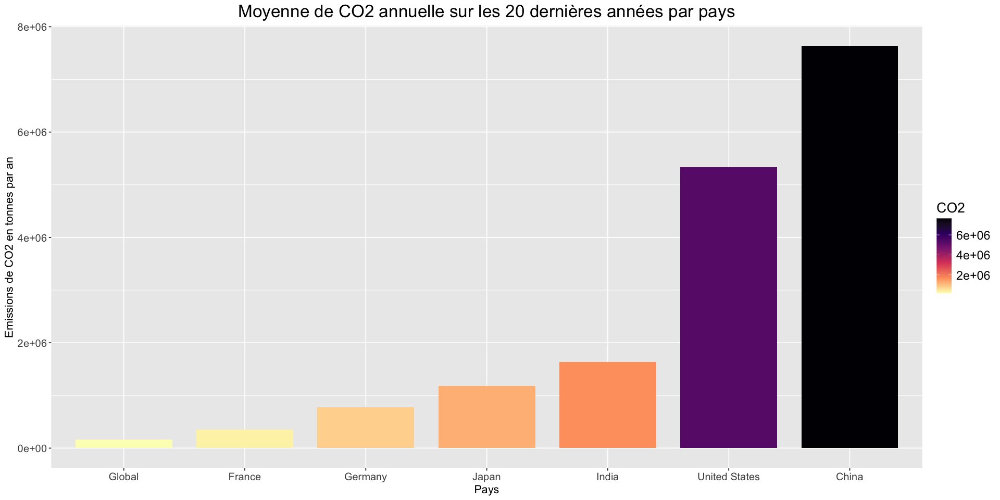

In [111]:
options(repr.plot.width = 16)
df <- energy$Value_co2_emissions_kt_by_country
df <-  matrix(df, nrow = 2868)
df <- as.data.frame(df)
colnames(df) = list("CO2")
df$Country <- energy$Entity
df_mean <- summarise(group_by(df, Country), mean_value = mean(CO2))
CO2 <- df_mean$mean_value
Country <- df_mean$Country
df <- data.frame(Country = Country, CO2 = CO2)
fr <- df[48,] ## France
df <- arrange(df, desc(CO2))
top_5 <- head(df, 5)
last_5 <- tail(df,5)
moyenne <- mean(df$CO2)
mean <- data.frame("Country" = "Global", "CO2" = moyenne)
df <- rbind(top_5, fr)
df <- rbind(df,mean)
#df <- rbind(df,last_5)
ggplot(df, aes(x=reorder(Country, CO2), y=CO2, fill=CO2)) +
  geom_bar(stat = "identity", position = "stack", width = 0.8) +
  labs(title = "Moyenne de CO2 annuelle sur les 20 dernières années par pays", x = "Pays", y = "Emissions de CO2 en tonnes par an") +
  theme(plot.title = element_text(size = 20, hjust = 0.5), 
        axis.text.y = element_text(size = 12),
        axis.title.y = element_text(size = 13),
        axis.text.x = element_text(size = 12),
       axis.title.x = element_text(size = 13),
       legend.text = element_text(size = 14),  
       legend.title = element_text(size = 16), 
       legend.position = "right") + 
       scale_fill_viridis_c(option = "A", direction = -1)

#### On peut voir que les 5 pays les plus émetteurs sont la Chine, les Etats-Unis, l'Inde, le Japon et l'Allemagne. On a décidé de regarder également la France ainsi que la moyenne globale de tous les pays. Sur le graphe du dessous, on représente sur la carte du monde cette moyenne d'emission pour chaque pays.

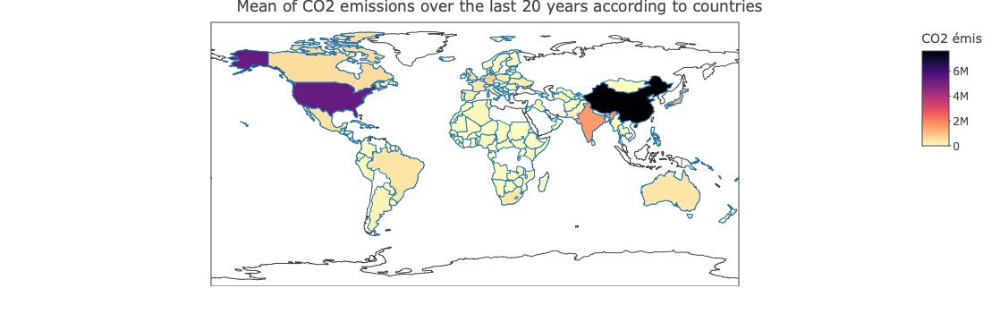

In [112]:
library(viridis)
options(repr.plot.width = 16)
dfa <- energy$Value_co2_emissions_kt_by_country
dfa <-  matrix(dfa, nrow = 2868)
dfa <- as.data.frame(dfa)
colnames(dfa) = list("CO2")
dfa$Country <- energy$Entity
df_mean <- summarise(group_by(dfa, Country), mean_value = mean(CO2))
CO2 <- df_mean$mean_value
Country <- df_mean$Country
dfa <- data.frame(Country = Country, CO2 = CO2)
plot_ly(data = dfa, type = "choropleth", locations = ~Country, locationmode = "country names", z = ~CO2, text = ~paste("Pays: ", Country, "<br>CO2 emissions (metric tons per year): ", CO2),colors = viridis(100, direction = -1, option ="A")) %>%
  colorbar(title = "CO2 émis",colors = viridis(100, direction = -1, option ="A")) %>%
  layout(title = "Mean of CO2 emissions over the last 20 years according to countries")

Graphe des pays/annees

#### On regarde la distribution de nos variables. On va transformer les variables pour essayer de les faire ressembler à des gaussiennes.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwid

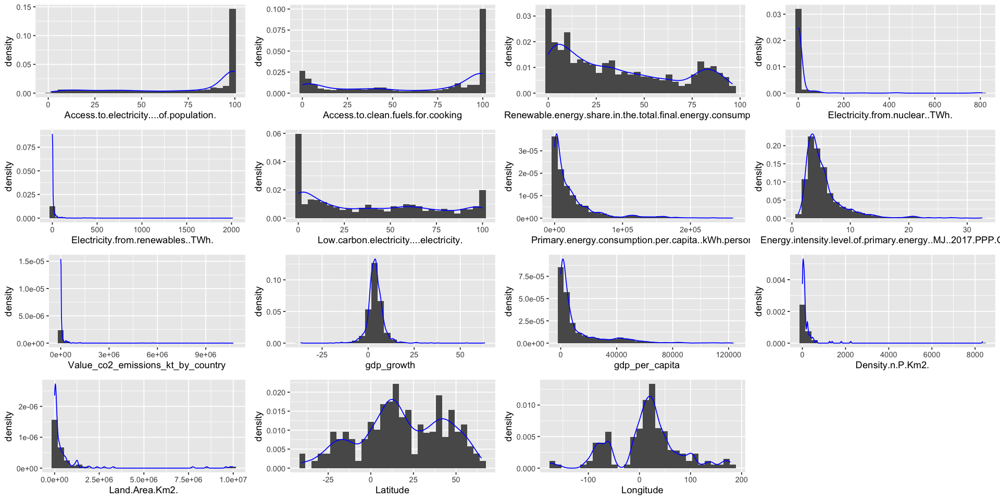

In [113]:
## que des variables quantitatives mis à part Entity et Year
g1<-ggplot(energy,aes(x=Access.to.electricity....of.population.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g2<-ggplot(energy,aes(x=Access.to.clean.fuels.for.cooking))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g3<-ggplot(energy,aes(x=Renewable.energy.share.in.the.total.final.energy.consumption....))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
# g4<-ggplot(energy,aes(x=Electricity.from.fossil.fuels..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g5<-ggplot(energy,aes(x=Electricity.from.nuclear..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g6<-ggplot(energy,aes(x=Electricity.from.renewables..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g7<-ggplot(energy,aes(x=Low.carbon.electricity....electricity.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g8<-ggplot(energy,aes(x=Primary.energy.consumption.per.capita..kWh.person.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g9<-ggplot(energy,aes(x=Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g10<-ggplot(energy,aes(x=Value_co2_emissions_kt_by_country))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g11<-ggplot(energy,aes(x=gdp_growth))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g12<-ggplot(energy,aes(x=gdp_per_capita))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue")
g13<-ggplot(energy,aes(x=Density.n.P.Km2.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g14<-ggplot(energy,aes(x=Land.Area.Km2.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g15<-ggplot(energy,aes(x=Latitude))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g16<-ggplot(energy,aes(x=Longitude))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
grid.arrange(g1,g2,g3,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16,ncol=4)
rm(g1,g2,g3,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16)

In [114]:
energy[, "Access.to.electricity....of.population."] <- sqrt(energy[, "Access.to.electricity....of.population."])
energy[, "Access.to.clean.fuels.for.cooking"] <- sqrt(energy[, "Access.to.clean.fuels.for.cooking"])
energy[, "Renewable.energy.share.in.the.total.final.energy.consumption...."] <- sqrt(energy[, "Renewable.energy.share.in.the.total.final.energy.consumption...."])
#energy[, "Electricity.from.fossil.fuels..TWh."] <- sqrt(energy[, "Electricity.from.fossil.fuels..TWh."])
energy[, "Electricity.from.nuclear..TWh."] <- sqrt(energy[, "Electricity.from.nuclear..TWh."])
energy[, "Electricity.from.renewables..TWh."] <- sqrt(energy[, "Electricity.from.renewables..TWh."])
energy[, "Low.carbon.electricity....electricity."] <- sqrt(energy[, "Low.carbon.electricity....electricity."])
energy[, "Primary.energy.consumption.per.capita..kWh.person."] <- log(energy[, "Primary.energy.consumption.per.capita..kWh.person."])
energy[, "Value_co2_emissions_kt_by_country"] <- log(energy[, "Value_co2_emissions_kt_by_country"])
energy[, "gdp_per_capita"] <- log(energy[, "gdp_per_capita"])
energy[, "Density.n.P.Km2."] <- log(energy[, "Density.n.P.Km2."])
energy[, "Land.Area.Km2."] <- log(energy[, "Land.Area.Km2."]) 

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwid

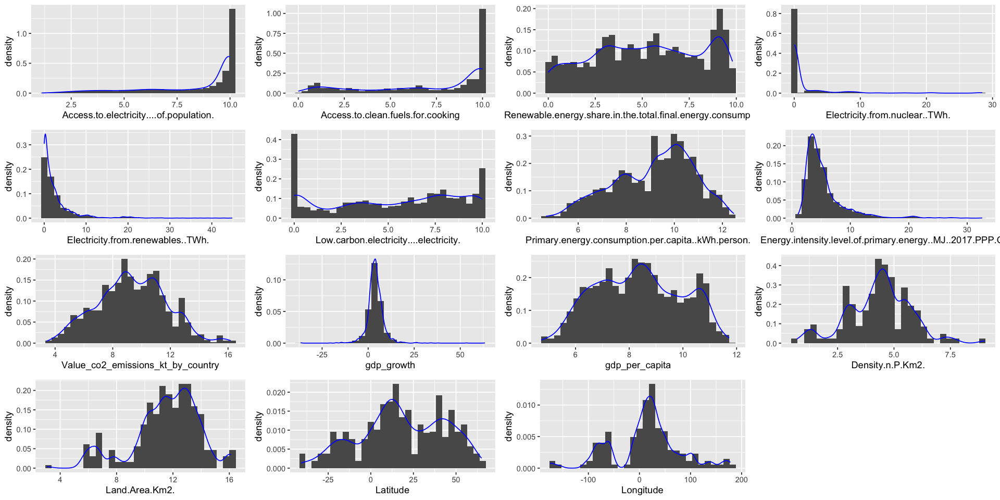

In [115]:
g1<-ggplot(energy,aes(x=Access.to.electricity....of.population.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g2<-ggplot(energy,aes(x=Access.to.clean.fuels.for.cooking))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g3<-ggplot(energy,aes(x=Renewable.energy.share.in.the.total.final.energy.consumption....))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
#g4<-ggplot(energy,aes(x=Electricity.from.fossil.fuels..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g5<-ggplot(energy,aes(x=Electricity.from.nuclear..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g6<-ggplot(energy,aes(x=Electricity.from.renewables..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g7<-ggplot(energy,aes(x=Low.carbon.electricity....electricity.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g8<-ggplot(energy,aes(x=Primary.energy.consumption.per.capita..kWh.person.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g9<-ggplot(energy,aes(x=Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g10<-ggplot(energy,aes(x=Value_co2_emissions_kt_by_country))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g11<-ggplot(energy,aes(x=gdp_growth))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g12<-ggplot(energy,aes(x=gdp_per_capita))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue")
g13<-ggplot(energy,aes(x=Density.n.P.Km2.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g14<-ggplot(energy,aes(x=Land.Area.Km2.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g15<-ggplot(energy,aes(x=Latitude))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g16<-ggplot(energy,aes(x=Longitude))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
grid.arrange(g1,g2,g3,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16,ncol=4)
rm(g1,g2,g3,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16)

## II. 2- Analyse multidimensionnelle

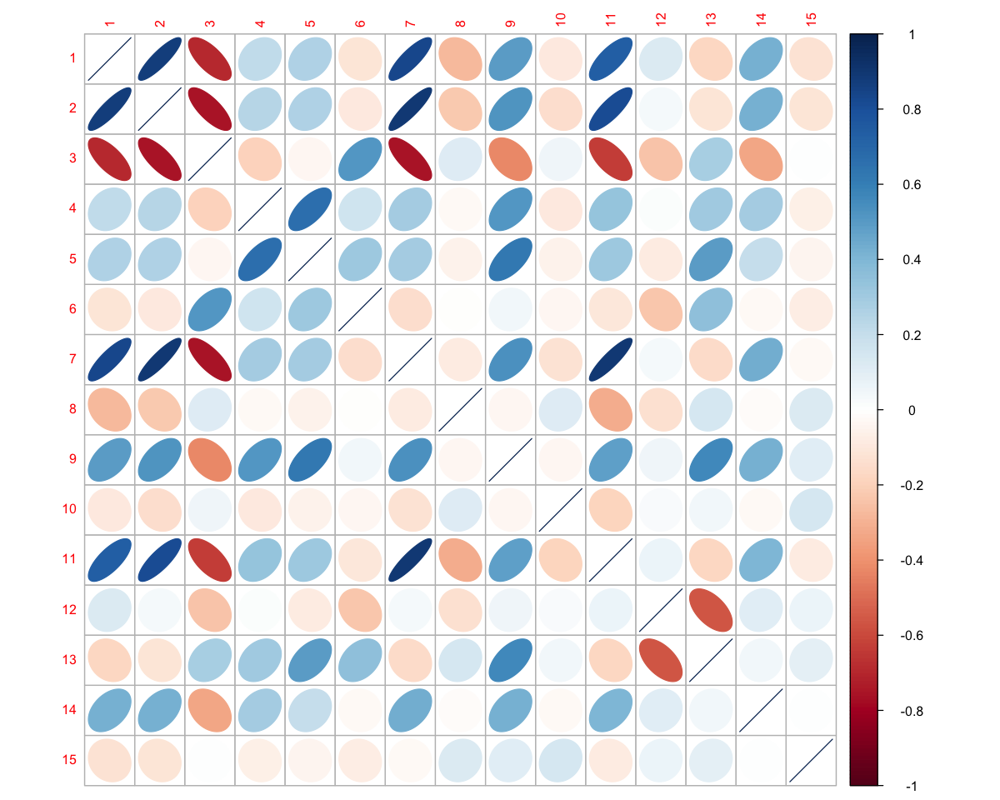

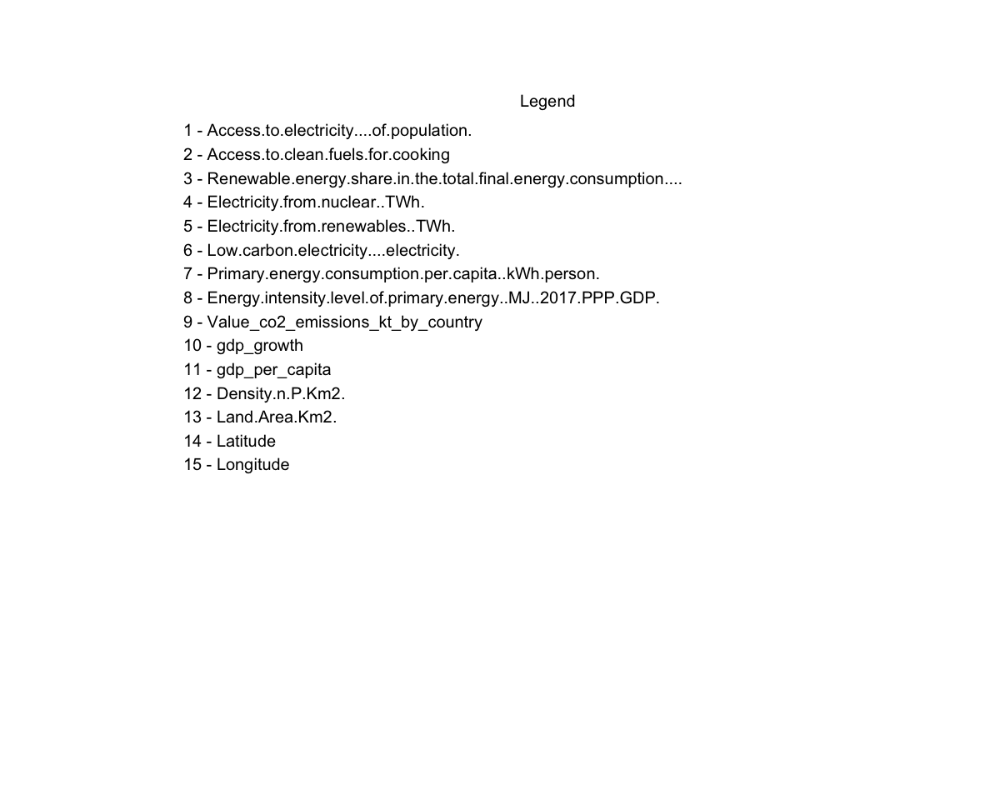

In [116]:
library(corrplot)
options(repr.plot.width = 10, repr.plot.height = 8)
energy2 <- energy
original_names <- colnames(energy2)[3:17]
colnames(energy2)[3:17] <- 1:15

cor_matrix <- cor(energy2[, c(3:17)])

corrplot(cor_matrix, method = "ellipse", tl.cex = 0.8)

plot.new()
legend_names <- c(paste(1:15, " - ",original_names, sep = ""))
legend("topright", legend = legend_names, title = "Legend", cex = 1, bty = "n", col = "black")

#### On peut voir que la variable à prédire Value_co2_emissions_kt_by_country est correlée positivement avec Electricity from renewables et Electricity from nuclear et Land Area. Elle est correlée négativement avec Renewable energy share in the total final energy consumption (la part d'énergie renouvelables dans la consommation d'énergie globale). \\
#### Le fait que les énergies renouvelables et les énergies du nucléaires soient corrélées positivement avec l'émission de CO2 peut sembler contre-intuitif, cependant les pays qui utilisent ces énergies sont plutôt des pays riches, ce qui peut expliquer qu'ils consomment plus donc émettent plus. C'est pour cela que la variable qui représente la part d'énergie renouvelable dans la consommation globale est intéressante à regarder, et on voit bien que dans ce cas c'est correlée négativement.

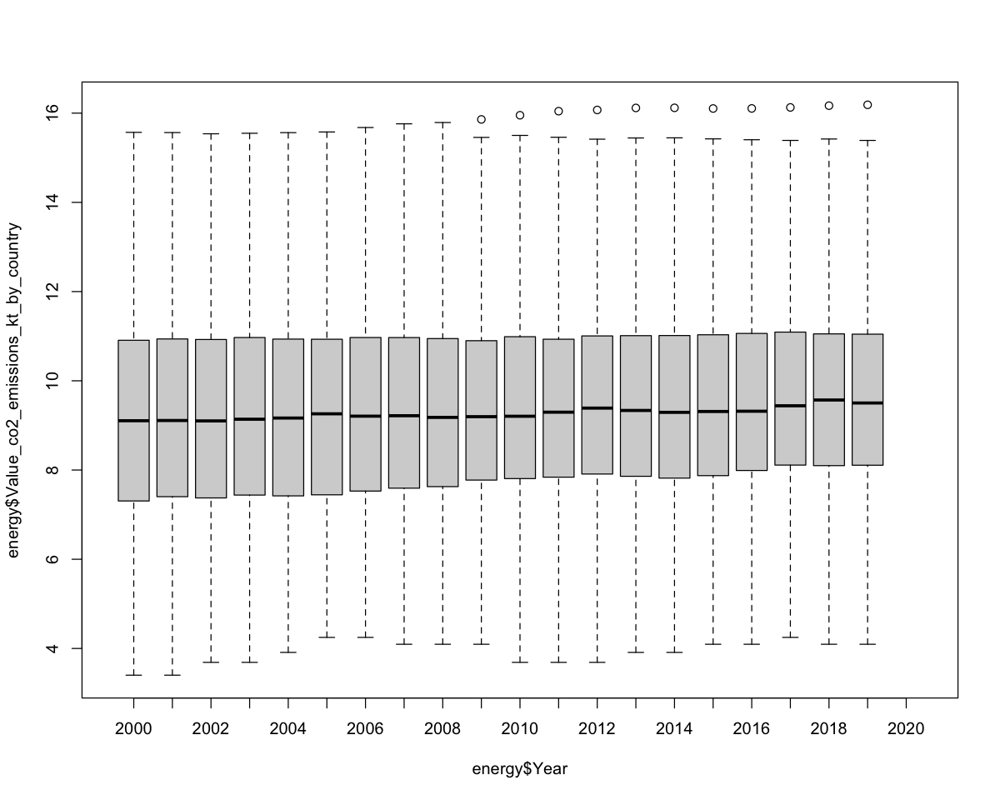

In [117]:
boxplot(energy$Value_co2_emissions_kt_by_country ~ energy$Year, data=energy)

#### Ce boxplot nous permet de constater que la moyenne globale de CO2 émise par an ne semble pas augmenter depuis 2000. 

In [118]:
library(forcats)
energy$Country <- as.factor(energy$Entity)
energy$Entity <- as.factor(energy$Entity)
#energy$Entity <- fct_collapse(energy$Entity, "PIB ++" = c("Australia","Canada","China","Denmark","Finland","France","Germany","Iceland","Ireland","India","Italy","Japan",
                                                      #    "Luxembourg","Netherlands","Norway","Qatar","Singapore","Spain","Sweden","Switzerland","United Arab Emirates",
                                                       #   "United Kingdom","United States","Cyprus"), "PIB +" = c("Algeria","Argentina","Austria","Belgium","Brazil","Cameroon","Colombia",
                           #   "Croatia","Ecuador","Estonia","Greece","Hungary","Israel","Malta","Mexico","Morocco","New Zealand","Nigeria","Oman","Peru","Philippines","Poland","Portugal",
                            #  "Romania","Serbia","Seychelles","Thailand","Slovenia","South Africa","Tunisia","Ukraine","Uruguay"), "PIB -" = c("Armenia","Angola","Antigua and Barbuda","Azerbaijan","Bahrain",
                                                                                                                                           #    "Barbados","Belarus","Belize","Benin","Bhutan","Bosnia and Herzegovina",
                                                                                                                                           #   "Botswana","Cambodia",
                                                                                                                                           #   "Costa Rica","Cuba","Dominica","Dominican Republic","El Salvador","Equatorial Guinea",
                                                                                                                                            #  "Eswatini","Fiji","Gabon","Georgia","Ghana","Grenada","Guatemala","Guinea",
                                                                                                                                            #  "Guinea-Bissau","Guyana","Honduras","Iraq","Jamaica","Jordan","Kenya","Kuwait","Latvia","Lithuania","Maldives","Mauritius","Mongolia","Montenegro",
                                                                                                                                            #  "Namibia","Nauru","Nicaragua","North Macedonia","Pakistan","Panama","Papua New Guinea","Paraguay","Samoa",
                                                                                                                                            #  "Sri Lanka","Suriname","Tajikistan","Tonga","Trinidad and Tobago","Turkmenistan","Uzbekistan","Zimbabwe"),
                            # "PIB --" = c("Afghanistan","Bangladesh","Burkina Faso","Burundi","Central African Republic","Comoros","Chad","Djibouti","Eritrea","Ethiopia","Haiti","Kiribati","Lesotho","Liberia","Madagascar","Malawi","Mali","Mauritania","Mozambique","Myanmar","Nepal","Niger","Rwanda","Sao Tome and Principe",
                                         # "Senegal","Sierra Leone","Solomon Islands","Somalia","South Sudan","Sudan","Togo","Uganda","Vanuatu","Zambia"))
energy$Entity <- fct_collapse(energy$Entity,
  "Europe" = c("Austria","Belgium","Belarus","Bosnia and Herzegovina","Bulgaria","Croatia","Cyprus","Czechia","Denmark","Estonia","Moldova","Finland","France","Germany","Greece","Hungary","Iceland","Serbia","Portugal","Ireland","Turkey","Italy","Latvia","Lithuania","Luxembourg","Malta","Netherlands","Norway","Poland","Portugal","Montenegro","Romania","Serbia","Slovakia","Slovenia","Spain","Sweden","Switzerland","United Kingdom","Ukraine"),
  "America" = c("Barbados","Guyana","Grenada","Dominica","Cuba","Costa Rica","Belize","Antigua and Barbuda","Ecuador","Argentina","Brazil","Canada","Chile","Colombia","Mexico","Haiti","Honduras","Jamaica","Paraguay","Venezuela","Peru","Uruguay","United States","Bolivia","Suriname","El Salvador","Panama","Nicaragua","Guatemala"),
  "Asia-Oceania" = c("Nauru","Maldives","Kiribati","Bhutan","Bahrain","China","Afghanistan","Armenia","Azerbaijan","Bangladesh","Cambodia","Australia","Dominican Republic","Egypt","Hong Kong","Pakistan","New Zealand","Taiwan","United Arab Emirates","Thailand","South Korea","Philippines","Saudi Arabia","Singapore","India","Indonesia","Iran","Israel","Japan","Malaysia","Fiji","Gabon","Georgia","Iraq","Jordan","Kazakhstan","Kuwait","Kyrgyzstan","Laos","Lebanon","Lesotho","Libya","Madagascar","Malawi","Mauritania","Mauritius","Mongolia","Mozambique","Myanmar","Namibia","Nepal","North Macedonia","Oman","Papua New Guinea","Qatar","Samoa","Seychelles","Sierra Leone","Solomon Islands","Sri Lanka","Syria","Tajikistan","Tanzania","Timor-Leste","Tonga","Trinidad and Tobago","Tunisia","Turkmenistan","Uzbekistan","Vanuatu","Vietnam","Yemen"),
  "Africa" = c("Algeria","Angola","Benin","Botswana","Burkina Faso","Burundi","Burundi","Cabo Verde","Cameroon","Central African Republic","Cameroon","Central African Republic","Nigeria","Equatorial Guinea","South Africa","Eritrea","Ethiopia","Chad","Comoros","Congo","Djibouti","Chad","Comoros","Congo","Democratic Republic of Congo","Djibouti","Egypt","Equatorial Guinea","Gambia","Guinea","Guinea-Bissau","Kenya","Ghana","Eritrea","Eswatini","Ethiopia","Liberia","Gabon","Gambia","Ghana","Mali","Guinea","Guinea-Bissau","Kenya","Lesotho","Morocco","Liberia","Libya","Madagascar","Niger","Malawi","Mali","Mauritania","Mauritius","Senegal","Morocco","Rwanda","Mozambique","Namibia","Somalia","Sudan","Niger","Nigeria","Togo","Rwanda","Sao Tome and Principe","Senegal","Seychelles","Uganda","Sierra Leone","Somalia","South Africa","South Sudan","Zambia","Zimbabwe","Sudan","Tanzania","Togo","Tunisia","Uganda","Zambia","Zimbabwe")
)
#df <- energy$Value_co2_emissions_kt_by_country
#df <-  matrix(df, nrow = 2868)
#df <- as.data.frame(df)
#colnames(df) = list("CO2")
#df$Entity <- energy$Entity
#df_mean <- summarise(group_by(df, Entity), mean_value = mean(CO2))
#CO2 <- df_mean$mean_value
#Entity <- df_mean$Entity
#df <- data.frame(Entity = Entity, CO2 = CO2)
#fr <- df[48,] ## France
#df <- arrange(df, desc(CO2))
#intervals <- c(0, 8, 10, 12, 14, 16)
#labels <- c("--", "-", "=", "+", "++")
#df$u <- cut(df$CO2, breaks = intervals, labels = labels, include.lowest = TRUE)
# Créer un dataframe avec les correspondances entre les pays et les modalités
#modalites <- data.frame(Entity = df$Entity, Type = df$u)
# Joindre les deux dataframes en fonction du nom du pays
#energy <- merge(energy, modalites, by = "Entity", all.x = TRUE)
# Afficher les premières lignes du dataframe pour vérifier
head(energy)
energy$Period <- fct_collapse(energy$Year, "2000-2004" = c("2000","2001","2002","2003","2004"), "2005-2009" = c("2005","2006","2007","2008","2009"),
                            "2010-2014" = c("2010","2011","2012","2013","2014"), "2015-2020" = c("2015","2016","2017","2018","2019","2020"))       
print(table(energy$Entity))
str(energy)

Warning message:
“Unknown levels in `f`: Bulgaria, Czechia, Moldova, Turkey, Slovakia, Chile, Venezuela, Bolivia, Egypt, Hong Kong, Taiwan, South Korea, Saudi Arabia, Indonesia, Iran, Malaysia, Kazakhstan, Kyrgyzstan, Laos, Lebanon, Libya, Syria, Tanzania, Timor-Leste, Vietnam, Yemen, Cabo Verde, Congo, Congo, Democratic Republic of Congo, Egypt, Gambia, Gambia, Libya, Tanzania”


,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,Low.carbon.electricity....electricity.,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude,Country
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
4,Asia-Oceania,2003,3.839076,3.082207,6.054750,0,0.7937254,8.186653,5.437941,1.40,7.106606,8.832278,5.250617,4.094345,13.38815,33.93911,67.70995,Afghanistan
5,Asia-Oceania,2004,4.479394,3.301515,6.651316,0,0.7483315,7.932298,5.319253,1.20,6.937314,1.414118,5.353667,4.094345,13.38815,33.93911,67.70995,Afghanistan
6,Asia-Oceania,2005,5.038938,3.492850,5.820653,0,0.7681146,7.964977,5.529703,1.41,7.346010,11.229715,5.489067,4.094345,13.38815,33.93911,67.70995,Afghanistan
7,Asia-Oceania,2006,5.542444,3.721559,5.647123,0,0.8000000,8.728716,5.718411,1.50,7.473069,5.357403,5.574940,4.094345,13.38815,33.93911,67.70995,Afghanistan
8,Asia-Oceania,2007,6.004249,3.911521,5.364699,0,0.8660254,8.885233,5.870087,1.53,7.478735,13.826320,5.885251,4.094345,13.38815,33.93911,67.70995,Afghanistan
9,Asia-Oceania,2008,6.511528,4.086563,4.601087,0,0.7348469,8.600733,6.409901,1.94,8.177516,3.924984,5.898975,4.094345,13.38815,33.93911,67.70995,Afghanistan



Asia-Oceania       Africa      America       Europe 
         846          856          520          646 
'data.frame':	2868 obs. of  19 variables:
 $ Entity                                                          : Factor w/ 4 levels "Asia-Oceania",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Year                                                            : Factor w/ 21 levels "2000","2001",..: 4 5 6 7 8 9 10 11 12 13 ...
 $ Access.to.electricity....of.population.                         : num  3.84 4.48 5.04 5.54 6 ...
 $ Access.to.clean.fuels.for.cooking                               : num  3.08 3.3 3.49 3.72 3.91 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.05 6.65 5.82 5.65 5.36 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.794 0.748 0.768 0.8 0.866 ...
 $ Low.carbon.electricity....electricity.                          : num  8.

# III. ACP

#### On retire la variable à prédire et les variables qualitatives pour effectuer l'ACP.

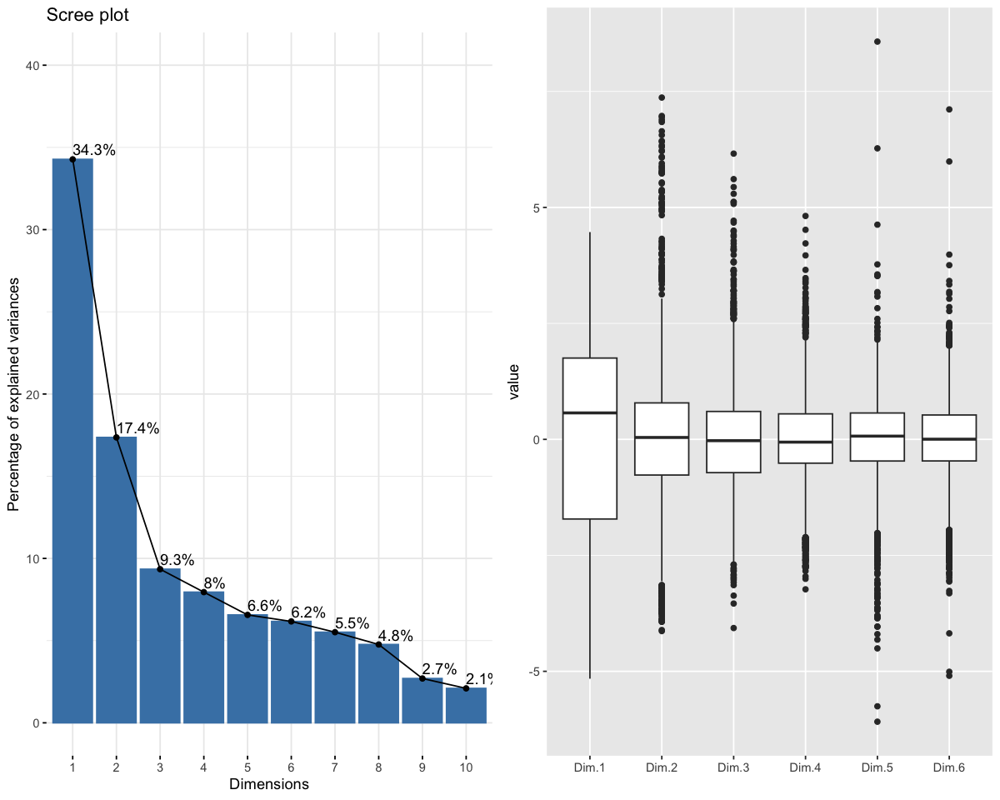

In [119]:
library(FactoMineR)
acp <- PCA(energy, scale.unit = TRUE,
           graph = FALSE, quali.sup = c(1,2,18,19), quanti.sup = 11, ncp = 6)

library(factoextra)
# graphe de la variance expliquée par dimension
g1<-fviz_eig(acp, addlabels = TRUE, ylim = c(0, 40))
library(reshape2)
g2<-ggplot(melt(acp$ind$coord),aes(x=Var2,y=value))+
  geom_boxplot()+
  xlab("")
grid.arrange(g1,g2,ncol=2)

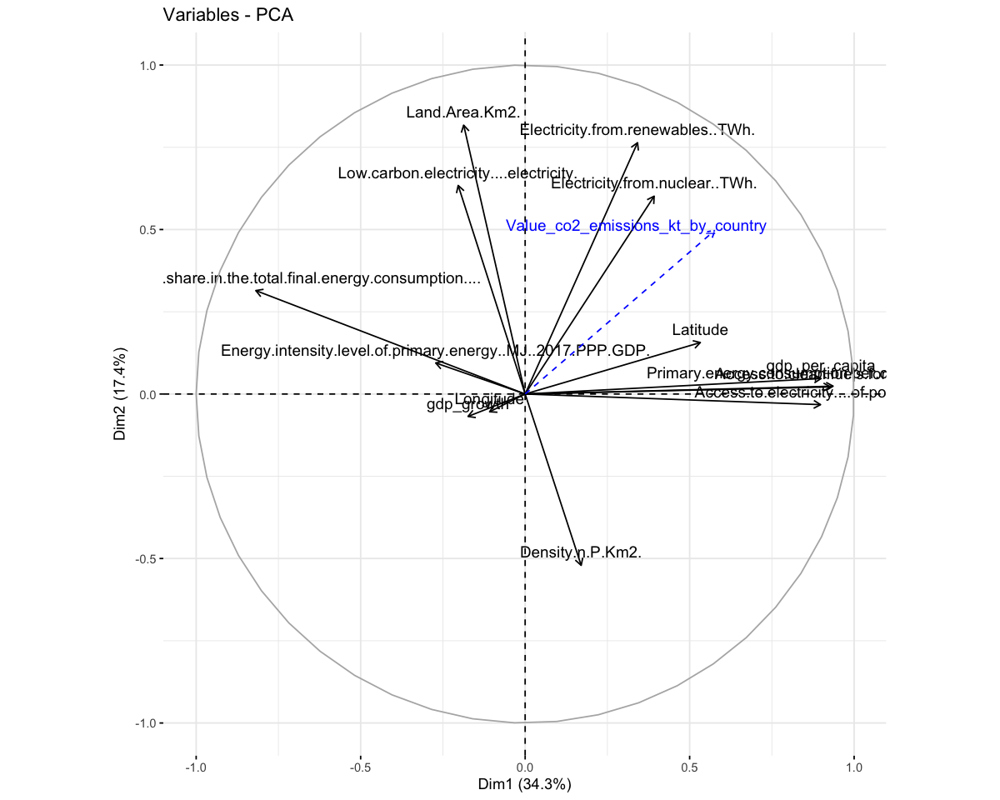

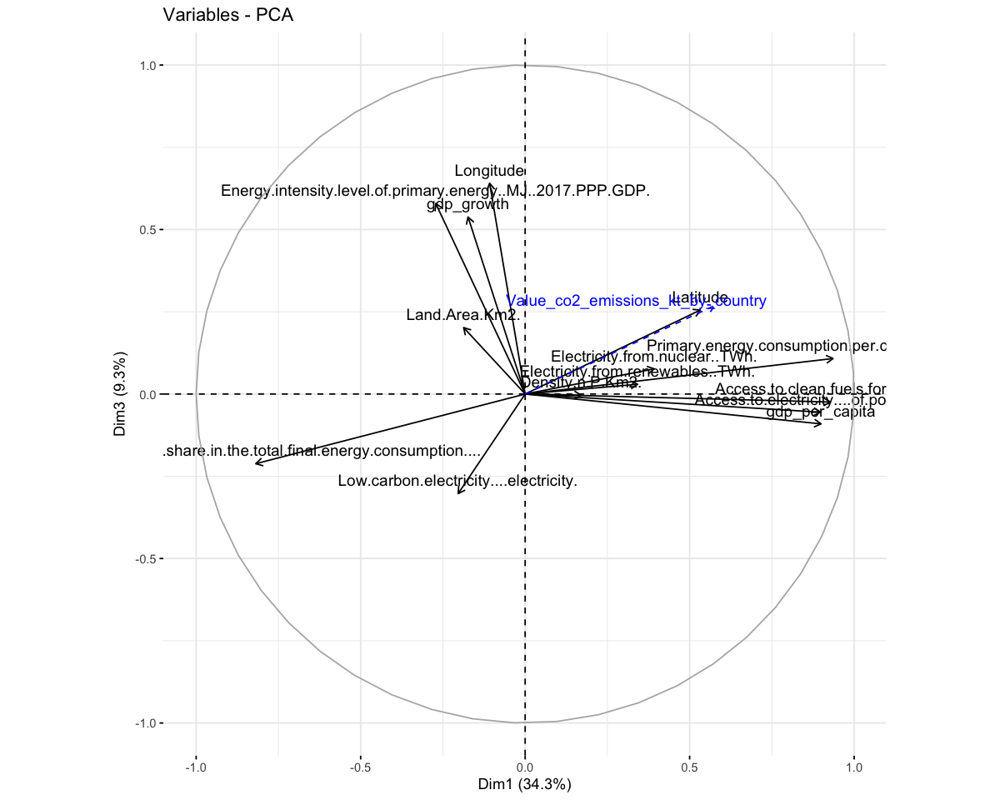

In [120]:
fviz_pca_var(acp)
fviz_pca_var(acp,axes=c(1,3))

#### Grâce à ces graphes, on peut voir que la dimension 1 semble être correlée avec l'accès à l'électricité, l'accès à l'électricité pour cuisiner, la consommation par habitant et le PIB par habitant. En conclusion, elle semble être corrélée positivement avec les pays riches/développés. 
#### Pour la dimension 2, on voit qu'elle est corrélée positivement la taille du pays (Land Area), la part d'électricité renouvelables, d'électricité nucléaire et de d'électricité bas carbone.

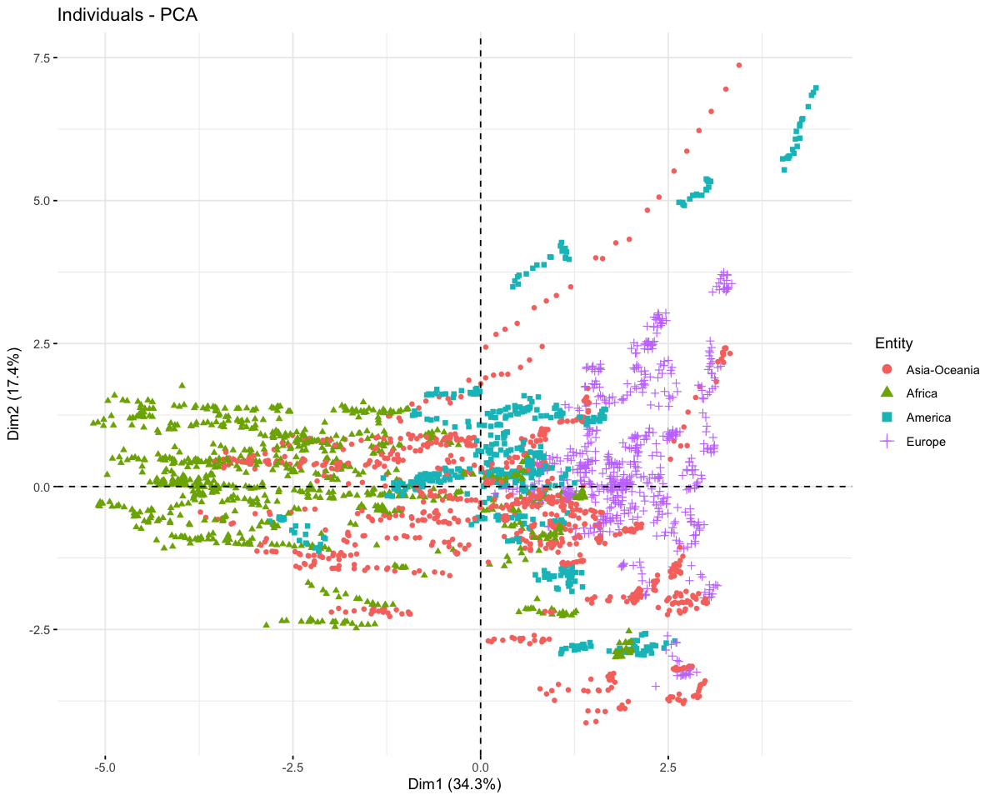

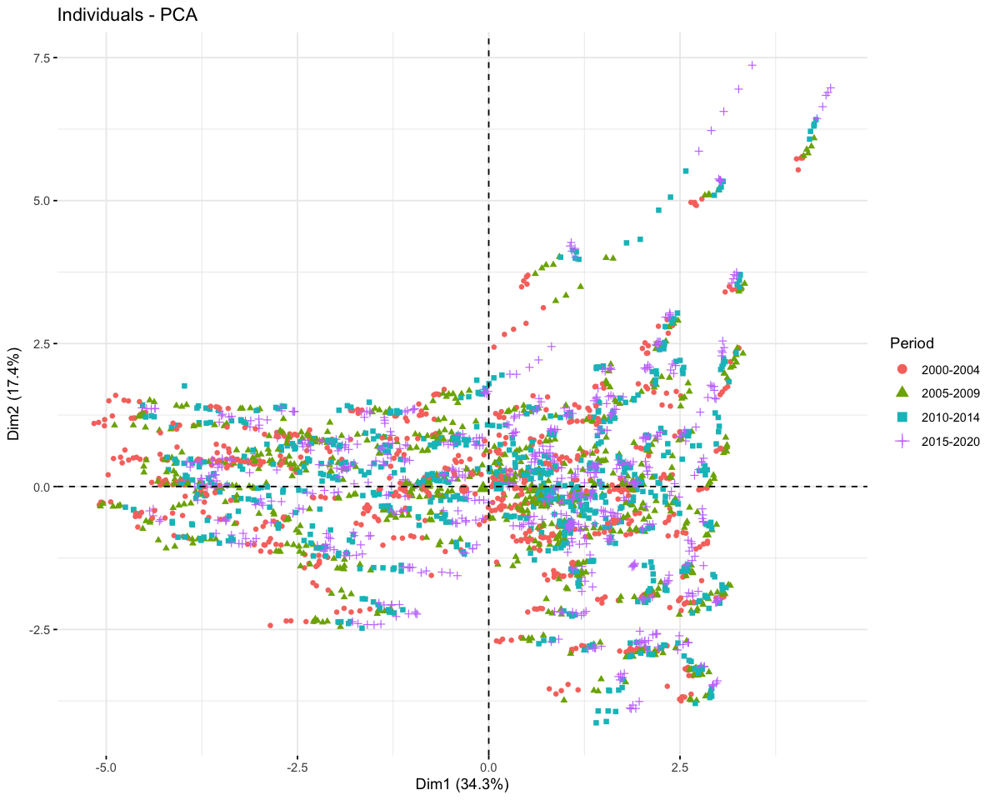

In [121]:
fviz_pca_ind(acp, label="none", habillage=1)
fviz_pca_ind(acp, label="none", habillage=19)

#### Grâce à ces graphes, on peut voir que la dimension 1 semble être correlée avec 

# IV. Modélisation

## IV.1 - Création du jeu de données test et apprentissage

In [81]:
set.seed(111) # initialisation du générateur

# Extraction des échantillons

test.ratio <- .2   # part de l'échantillon test
npop <- nrow(energy) # nombre de lignes dans les données
nvar <- ncol(energy) # nombre de colonnes

# taille de l'échantillon test
ntest <- ceiling(npop * test.ratio) 
# indices de l'échantillon test
testi <- sample(1:npop, ntest)
# indices de l'échantillon d'apprentissage
appri <- setdiff(1:npop, testi) 
### pour CO2 emissions
datappr <- energy[appri,] 
# construction de l'échantillon test
datestr <- energy[testi,] 
# vérification
str(datappr)
str(datestr)

'data.frame':	2294 obs. of  19 variables:
 $ Entity                                                          : Factor w/ 4 levels "Asia-Oceania",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Year                                                            : Factor w/ 21 levels "2000","2001",..: 4 5 6 8 9 10 11 12 14 15 ...
 $ Access.to.electricity....of.population.                         : num  3.84 4.48 5.04 6 6.51 ...
 $ Access.to.clean.fuels.for.cooking                               : num  3.08 3.3 3.49 3.91 4.09 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.05 6.65 5.82 5.36 4.6 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.794 0.748 0.768 0.866 0.735 ...
 $ Low.carbon.electricity....electricity.                          : num  8.19 7.93 7.96 8.89 8.6 ...
 $ Primary.energy.consumption.per.capita..kWh.person.              : num  5.44 

#### On crée également une fonction pour tracer le graphe des résidus

In [82]:
gplot.res <- function(x, y, titre = "titre"){
    ggplot(data.frame(x=x, y=y),aes(x,y))+
    geom_point(col = "blue")+xlim(0, 20)+ylim(-1.1, 1.1)+
    ylab("Résidus")+ xlab("Valeurs prédites")+
    ggtitle(titre)+
    geom_hline(yintercept = 0,col="green")
}

## IV. 2- Régression linéaire

### IV. 2-A Sans sélection de variable

In [83]:
### régression linéaire sans sélection de variable

reg.lm <- lm(Value_co2_emissions_kt_by_country ~ . - Country - Year , data = datappr)
summary(reg.lm)
anova(reg.lm,test="F")


Call:
lm(formula = Value_co2_emissions_kt_by_country ~ . - Country - 
    Year, data = datappr)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.16654 -0.17870  0.02094  0.18917  1.82049 

Coefficients:
                                                                   Estimate
(Intercept)                                                      -1.380e+01
EntityAfrica                                                      9.266e-02
EntityAmerica                                                     1.202e-01
EntityEurope                                                      2.164e-01
Access.to.electricity....of.population.                           1.628e-01
Access.to.clean.fuels.for.cooking                                -6.403e-03
Renewable.energy.share.in.the.total.final.energy.consumption.... -7.636e-02
Electricity.from.nuclear..TWh.                                    1.689e-03
Electricity.from.renewables..TWh.                                -4.158e-03
Low.carbon.electricity..

,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
Entity,3,3301.8061579,1100.6020526,10040.787228,0.000000e+00
Access.to.electricity....of.population.,1,1013.2964047,1013.2964047,9244.298222,0.000000e+00
Access.to.clean.fuels.for.cooking,1,136.9829996,136.9829996,1249.695246,1.584964e-218
Renewable.energy.share.in.the.total.final.energy.consumption....,1,46.9750001,46.9750001,428.552700,2.338677e-87
Electricity.from.nuclear..TWh.,1,1491.1778543,1491.1778543,13604.008386,0.000000e+00
Electricity.from.renewables..TWh.,1,1479.6159921,1479.6159921,13498.529572,0.000000e+00
Low.carbon.electricity....electricity.,1,0.6407927,0.6407927,5.845949,1.569113e-02
Primary.energy.consumption.per.capita..kWh.person.,1,0.1880191,0.1880191,1.715297,1.904319e-01
Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,1,94.9880313,94.9880313,866.575352,1.213652e-161


### IV.2-B Lasso

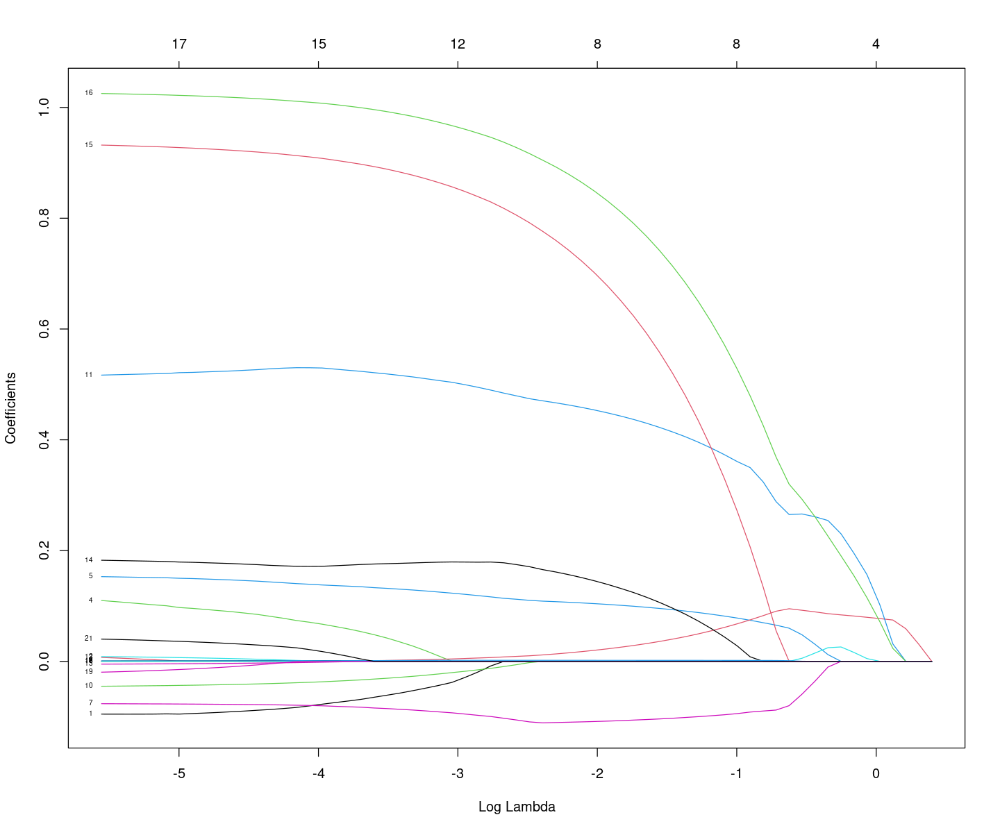

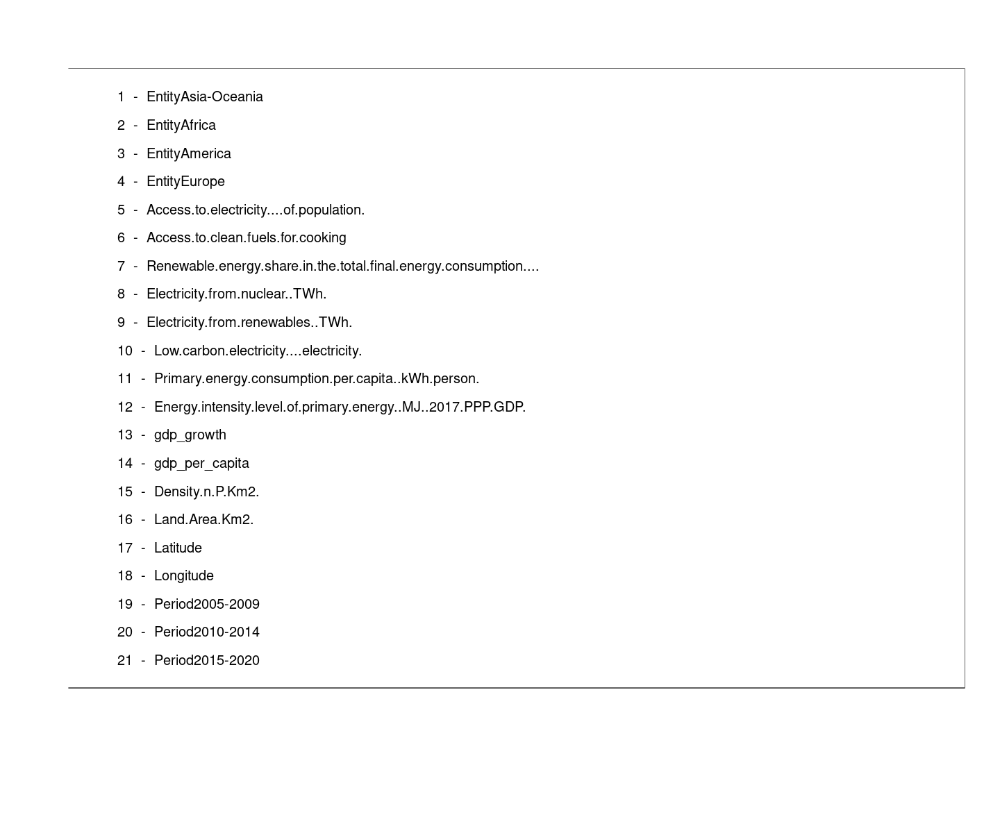

In [115]:
### Lasso
library(glmnet)
x.mat <- model.matrix(Value_co2_emissions_kt_by_country ~ . - 1 - Country - Year, data = datappr)
reg.lasso <- glmnet(y = datappr$Value_co2_emissions_kt_by_country, x = x.mat)
options(repr.plot.width = 12, repr.plot.height = 10)
plot(reg.lasso, xvar = "lambda", label = TRUE)

plot.new()
legend("topright", legend = paste(1:ncol(x.mat), " - ", colnames(x.mat)))

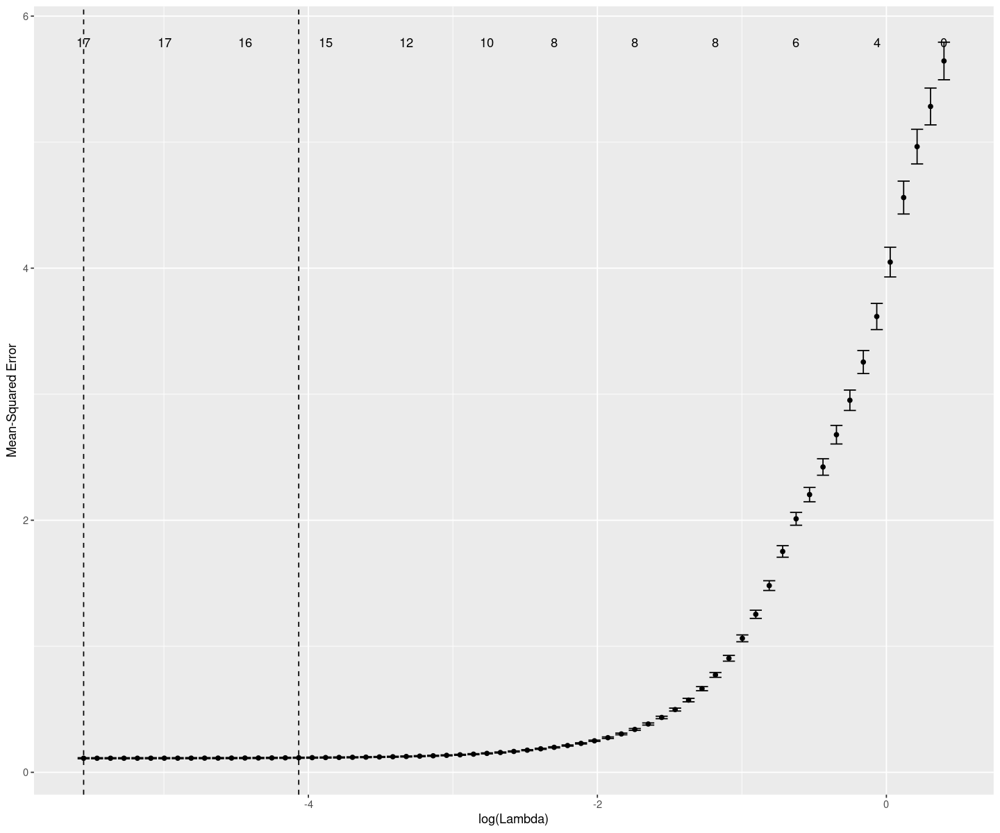

In [116]:
reg.lasso.cv <- cv.glmnet(y = datappr[, 11], x = x.mat)
autoplot(reg.lasso.cv)

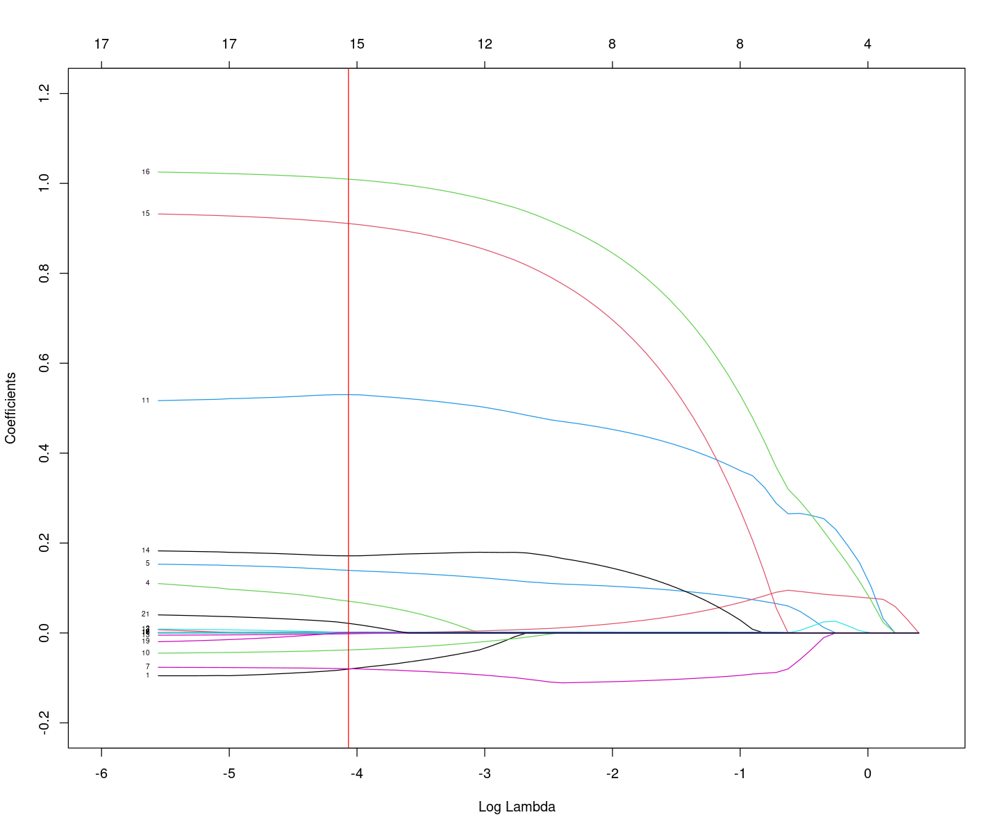

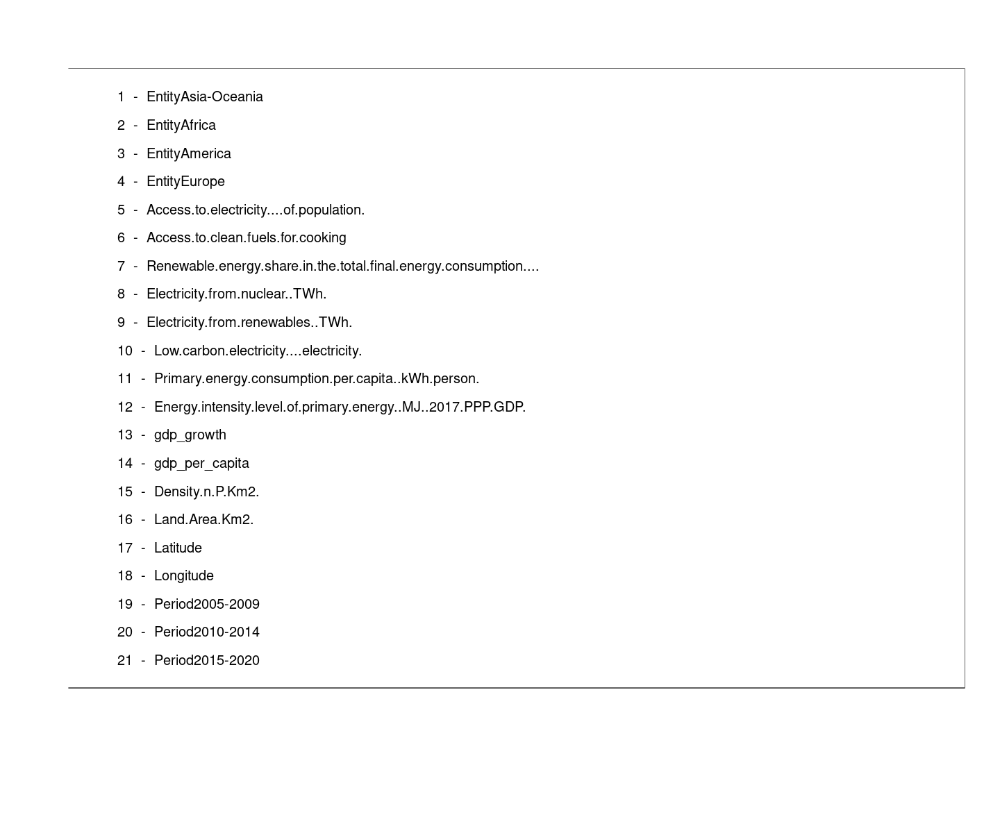

In [120]:
options(repr.plot.width = 12, repr.plot.height = 10)
plot(reg.lasso, xvar = "lambda", label = TRUE,xlim=c(-6,0.5),ylim=c(-0.2,1.2))
abline(v=log(reg.lasso.cv$lambda.1se),col="red")
plot.new()
legend("topright", legend = paste(1:ncol(x.mat), " - ", colnames(x.mat)))

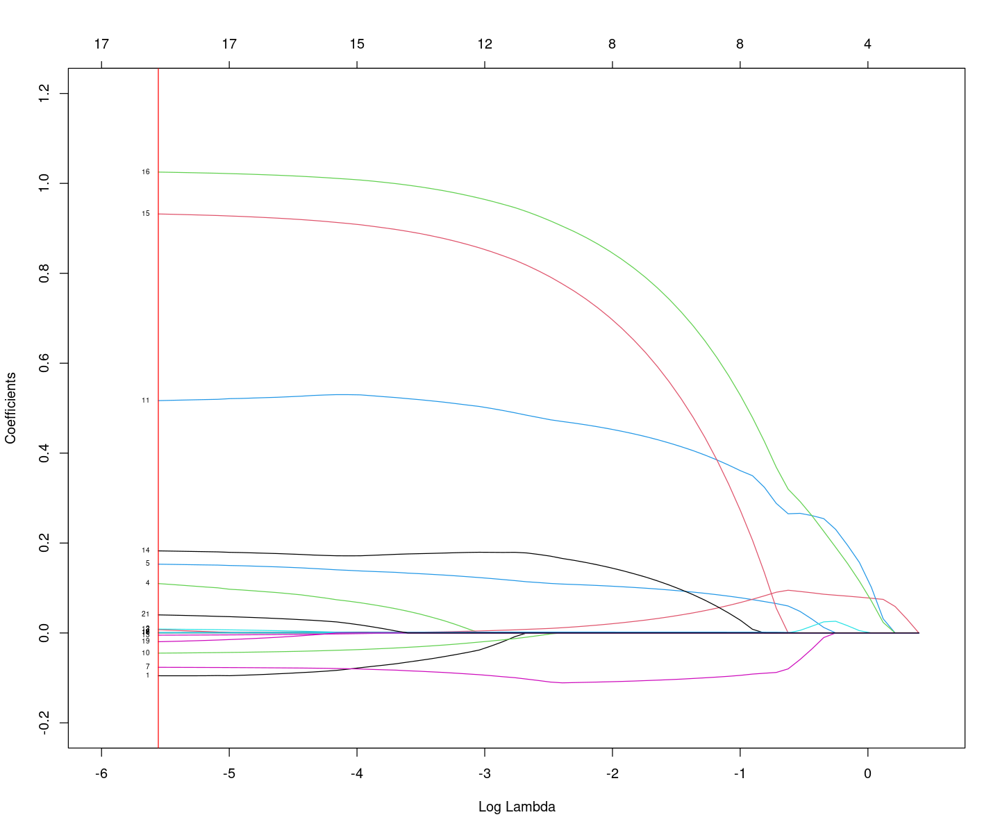

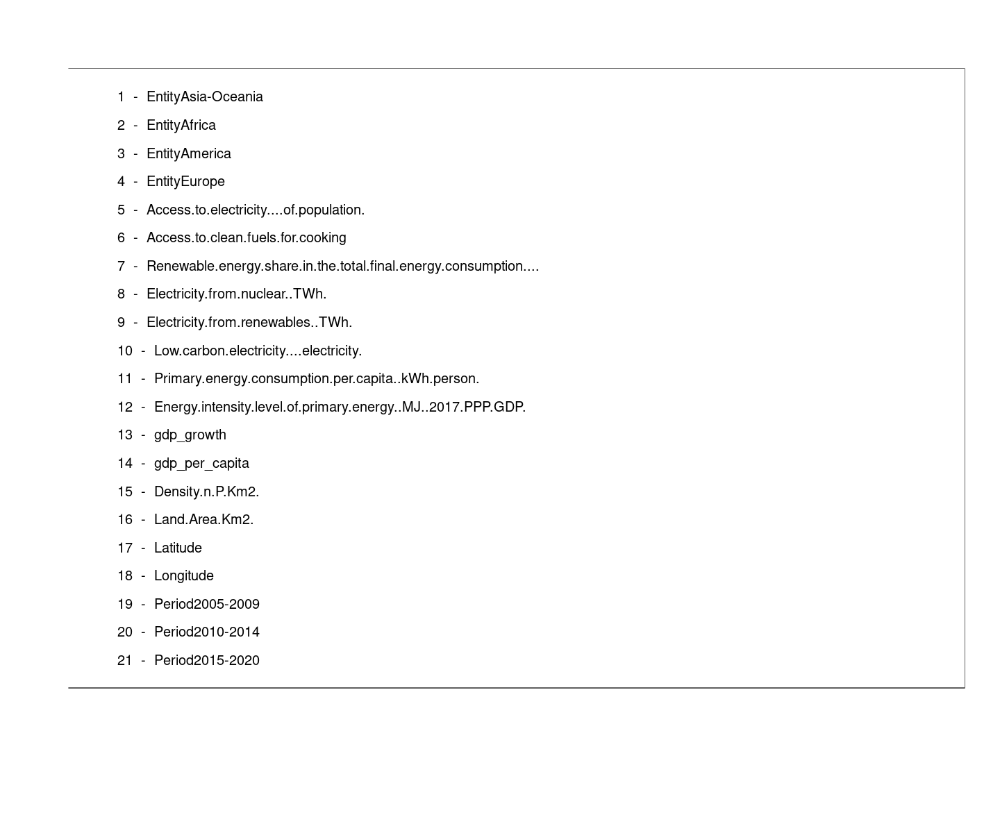

In [121]:
options(repr.plot.width = 12, repr.plot.height = 10)
plot(reg.lasso, xvar = "lambda", label = TRUE,xlim=c(-6,0.5),ylim=c(-0.2,1.2))
abline(v=log(reg.lasso.cv$lambda.min),col="red")
plot.new()
legend("topright", legend = paste(1:ncol(x.mat), " - ", colnames(x.mat)))

### IV.2-C AIC

In [123]:
### critère AIC linéaire
reg.glm.step <- step(reg.lm, direction = "backward")
summary(reg.glm.step)
anova(reg.glm.step)

Start:  AIC=-5050.67
Value_co2_emissions_kt_by_country ~ (Entity + Year + Access.to.electricity....of.population. + 
    Access.to.clean.fuels.for.cooking + Renewable.energy.share.in.the.total.final.energy.consumption.... + 
    Electricity.from.nuclear..TWh. + Electricity.from.renewables..TWh. + 
    Low.carbon.electricity....electricity. + Primary.energy.consumption.per.capita..kWh.person. + 
    Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. + 
    gdp_growth + gdp_per_capita + Density.n.P.Km2. + Land.Area.Km2. + 
    Latitude + Longitude + Country + Period) - Country - Year

                                                                   Df Sum of Sq
- Electricity.from.nuclear..TWh.                                    1       0.0
- Access.to.clean.fuels.for.cooking                                 1       0.1
<none>                                                                         
- Electricity.from.renewables..TWh.                                 1       0.2
-


Call:
lm(formula = Value_co2_emissions_kt_by_country ~ Entity + Access.to.electricity....of.population. + 
    Renewable.energy.share.in.the.total.final.energy.consumption.... + 
    Low.carbon.electricity....electricity. + Primary.energy.consumption.per.capita..kWh.person. + 
    Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. + 
    gdp_growth + gdp_per_capita + Density.n.P.Km2. + Land.Area.Km2. + 
    Latitude + Longitude + Period, data = datappr)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.16521 -0.18001  0.02537  0.18992  1.82261 

Coefficients:
                                                                   Estimate
(Intercept)                                                      -1.368e+01
EntityAfrica                                                      9.390e-02
EntityAmerica                                                     1.083e-01
EntityEurope                                                      2.167e-01
Access.to.electricity....of.popul

,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
Entity,3,3.301806e+03,1.100602e+03,1.004100e+04,0.000000e+00
Access.to.electricity....of.population.,1,1.013296e+03,1.013296e+03,9.244490e+03,0.000000e+00
Renewable.energy.share.in.the.total.final.energy.consumption....,1,1.302014e+02,1.302014e+02,1.187851e+03,7.923838e-210
Low.carbon.electricity....electricity.,1,3.222774e+02,3.222774e+02,2.940196e+03,0.000000e+00
Primary.energy.consumption.per.capita..kWh.person.,1,1.051933e+02,1.051933e+02,9.596979e+02,4.029523e-176
Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,1,1.559019e+02,1.559019e+02,1.422322e+03,3.185196e-242
gdp_growth,1,1.833058e+01,1.833058e+01,1.672332e+02,5.767793e-37
gdp_per_capita,1,5.755997e-06,5.755997e-06,5.251302e-05,9.942187e-01
Density.n.P.Km2.,1,7.885347e+00,7.885347e+00,7.193947e+01,3.932519e-17


Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”


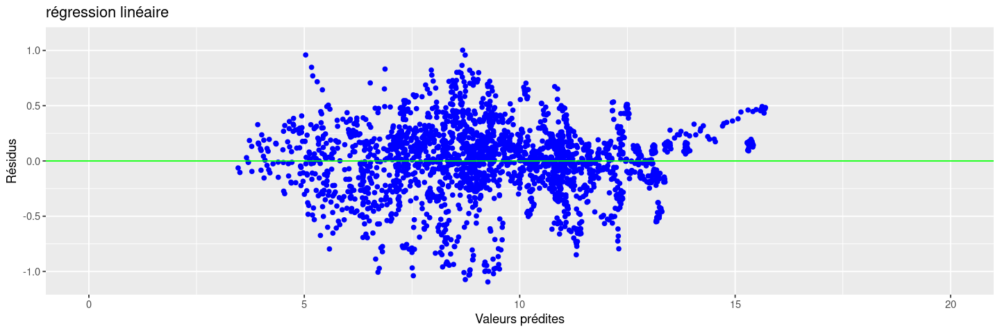

Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”


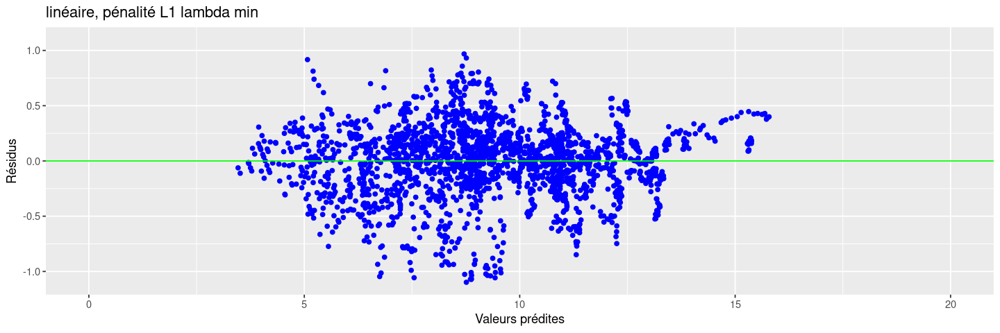

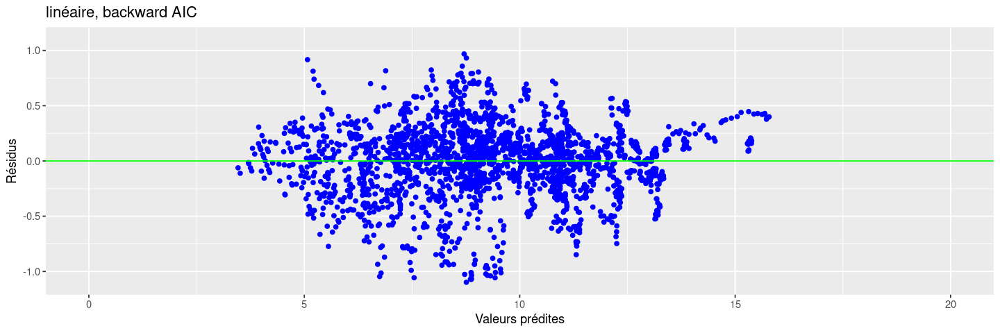

In [124]:
### linéaire pas de sélection
res.lm <- reg.lm$residuals
fit.lm <- reg.lm$fitted.values
### Lasso lambda min
fit.lasso <- predict(reg.lasso.cv, s = "lambda.min", newx = x.mat)
res.lasso <- datappr$Value_co2_emissions_kt_by_country - fit.lasso
### AIC
fit.glm <- reg.glm.step$fitted.values
res.glm <- reg.glm.step$residuals

# Graphe des résidus
options(repr.plot.width = 12, repr.plot.height = 4)
g1<-gplot.res(fit.lm, res.lm, "régression linéaire")
g2<-gplot.res(fit.lasso, res.lasso, "linéaire, pénalité L1 lambda min")
g3<-gplot.res(fit.lasso, res.lasso, "linéaire, backward AIC")
g1
g2
g3

In [129]:
# Calcul des prévisions pour le modèle linéaire complet
pred.glm <- predict(reg.lm, newdata = datestr)
# Erreur quadratique moyenne de prévision (MSE)
sum((pred.glm - datestr[, "Value_co2_emissions_kt_by_country"])^2) / nrow(datestr)

[1] 0.1109443

In [130]:
# Calcul des prévisions pour le modèle linéaire pénalisation Lasso
x.test <- model.matrix(Value_co2_emissions_kt_by_country ~ . - 1 - Country - Year, data = datestr)
reg.lasso.cv.test <- cv.glmnet(y = datestr[, 11], x = x.test)
fit.lasso <- predict(reg.lasso.cv.test, s = "lambda.min", newx = x.test)
# Erreur quadratique moyenne de prévision (MSE)
sum((fit.lasso - datestr[, "Value_co2_emissions_kt_by_country"])^2) / nrow(datestr)

[1] 0.1091881

In [131]:
# Calcul des prévisions pour le modèle linéaire backward AIC
pred.glm <- predict(reg.glm.step, newdata = datestr)
# Erreur quadratique moyenne de prévision (MSE)
sum((pred.glm - datestr[, "Value_co2_emissions_kt_by_country"])^2) / nrow(datestr)

[1] 0.1110044

In [96]:
### Conclusion de partie 1 : le meilleur modèle est le Lasso (0.11)

In [132]:
paste("CV estimate of lambda :", round(reg.lasso.cv$lambda.min, 3))
coef(reg.lasso.cv, s = "lambda.min")

[1] "CV estimate of lambda : 0.004"

22 x 1 sparse Matrix of class "dgCMatrix"
                                                                            s1
(Intercept)                                                      -1.349136e+01
EntityAsia-Oceania                                               -9.520670e-02
EntityAfrica                                                      .           
EntityAmerica                                                     7.112405e-03
EntityEurope                                                      1.098270e-01
Access.to.electricity....of.population.                           1.529636e-01
Access.to.clean.fuels.for.cooking                                 .           
Renewable.energy.share.in.the.total.final.energy.consumption.... -7.640564e-02
Electricity.from.nuclear..TWh.                                    5.842116e-04
Electricity.from.renewables..TWh.                                 .           
Low.carbon.electricity....electricity.                           -4.490559e-02
Primary.en

## IV.3 - SVM

#### Le but de la SVM est de séparer les données en classes à l'aide d'une frontière aussi simple que possible de façon à ce que la distance entre les classes et la frontière (distance que l'on appelle le marge) soit la plus grande possible. Pour cela, on a souvent besoin de projeter nos données dans un espace vectoriel de plus grande dimension (car les données ne sont pas forcément linéairement séparables). On le fait en utilisant des noyaux. Dans notre cas des noyaux linéaires, des noyaux radials et polynomials. 

In [124]:
library(e1071)

### IV.3-A Noyau linéaire

#### On commence par tuner le noyau linéaire $\langle x,x'\rangle$. Le seul paramètre que l'on doit tuner pour tous les noyaux est le coût C, qui est donc un hyperparamètre. On travaille en classification soft margin, c'est à dire qu'on autorise des points à être dans la marge à l'inverse du hard margin. Dans notre cas, C représente à quel point on pénalise les points à l'intérieur de la marge. Avec un petit coût, les points dans la marge sont moins pénalisés qu'avec un grand C.

In [127]:
svm.reg.lin.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Entity - Year - Country - Period, type = "eps-regression", data = datappr, kernel = "lin", cost = c(1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5))
summary(svm.reg.lin.tune)


Parameter tuning of ‘svm’:

- sampling method: 10-fold cross validation 

- best parameters:
 cost
    1

- best performance: 0.1165711 

- Detailed performance results:
  cost     error dispersion
1  1.0 0.1165711 0.02043615
2  1.5 0.1166351 0.02047565
3  2.0 0.1166240 0.02046492
4  2.5 0.1165884 0.02048172
5  3.0 0.1166163 0.02046596
6  3.5 0.1166177 0.02049281
7  4.0 0.1166231 0.02043588
8  4.5 0.1166291 0.02048511
9  5.0 0.1166254 0.02047892


Warning message:
“Removed 24 rows containing missing values or values outside the scale range
(`geom_point()`).”


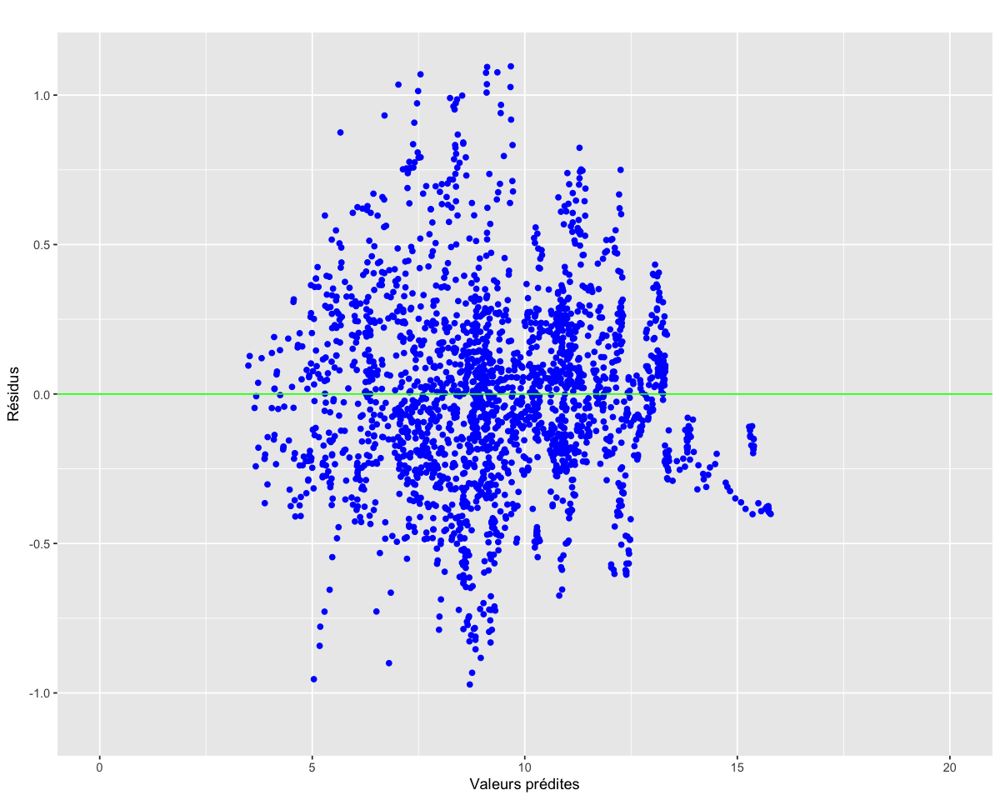

In [126]:
fit.svmr=svm.reg.lin.tune$best.model$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

#### Les résidus de notre modèle linéaire tuné sont symétriques et avec d'assez petites valeurs

### IV.3-B Noyau polynomial

#### Le noyau polynomial est défini comme : $(\gamma \langle x,x' \rangle+r)^d$. Ici en plus du coût C, il faut tuner les paramètres le degrée d, le coef0 r et le gamma. 

In [23]:
svm.reg.poly <- svm(Value_co2_emissions_kt_by_country ~ . - Entity - Year - Country - Period, type = "eps-regression", data = datappr, kernel = "poly")
summary(svm.reg.poly)


Call:
svm(formula = Value_co2_emissions_kt_by_country ~ . - Country - Year, 
    data = datappr, type = "eps-regression", kernel = "poly")


Parameters:
   SVM-Type:  eps-regression 
 SVM-Kernel:  polynomial 
       cost:  1 
     degree:  3 
      gamma:  0.07142857 
     coef.0:  0 
    epsilon:  0.1 


Number of Support Vectors:  1040






Warning message:
“Removed 52 rows containing missing values (`geom_point()`).”


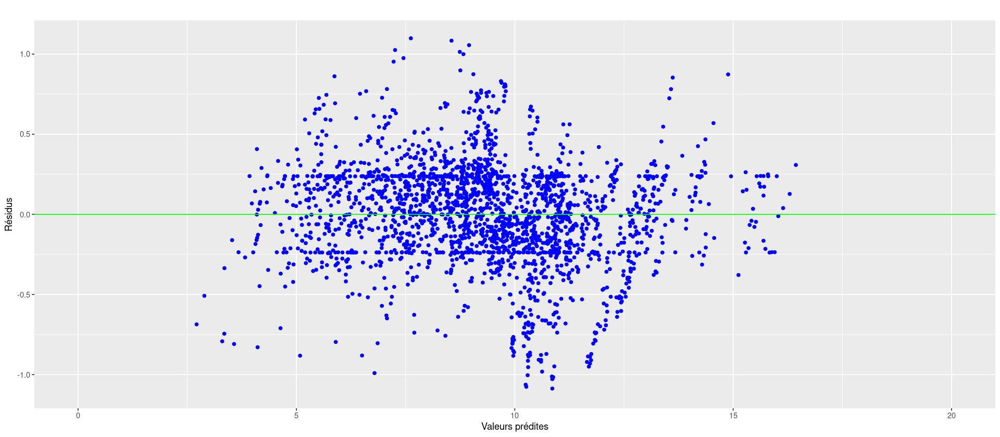

In [24]:
fit.svmr=svm.reg.poly$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

In [25]:
svm.reg.poly.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Entity - Year - Country - Period, type = "eps-regression", data = datappr, kernel = "poly", cost = c(1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5), coef0 = -5:5, gamma = seq(0.02, 0.1, by = 0.02), degree = 1:4)
summary(svm.reg.poly.tune)


Parameter tuning of ‘svm’:

- sampling method: 10-fold cross validation 

- best parameters:
 degree gamma coef0 cost
      3  0.06     5  1.5

- best performance: 0.03301648 

- Detailed performance results:
     degree gamma coef0 cost        error   dispersion
1         1  0.02    -5  1.0 1.578607e-01 2.351624e-02
2         2  0.02    -5  1.0 1.461119e+07 1.062041e+06
3         3  0.02    -5  1.0 8.436027e+04 1.859508e+04
4         4  0.02    -5  1.0 3.611895e+10 2.622720e+09
5         1  0.04    -5  1.0 1.563163e-01 2.285931e-02
6         2  0.04    -5  1.0 5.799240e+07 4.202106e+06
7         3  0.04    -5  1.0 1.381389e+06 2.981100e+05
8         4  0.04    -5  1.0 1.430757e+11 1.036671e+10
9         1  0.06    -5  1.0 1.561432e-01 2.268033e-02
10        2  0.06    -5  1.0 1.294855e+08 9.401788e+06
11        3  0.06    -5  1.0 7.413498e+06 1.398283e+06
12        4  0.06    -5  1.0 3.212576e+11 2.306000e+10
13        1  0.08    -5  1.0 1.560302e-01 2.267176e-02
14        2  0.08   

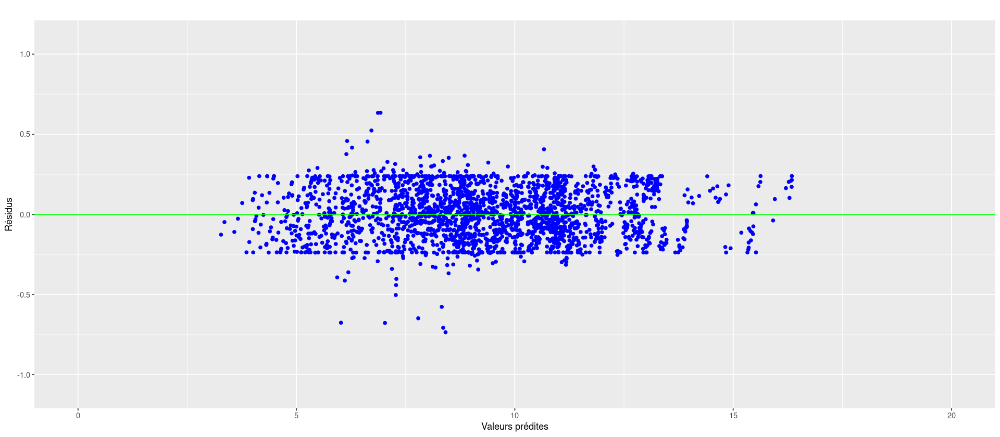

In [26]:
fit.svmr=svm.reg.poly.tune$best.model$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

#### Ici on peut observer un effet couloir sur nos résidus : il vient du paramètre epsilon qui représente une marge de tolérance où aucune pénalisation n'est appliquée aux erreurs.

### IV.3-C Noyau radial

#### Enfin, pour le noyau radial, $exp(-\gamma\lVert x-x' \rVert^2)$, il faut tuner les paramètres gamma et le coût C.

In [27]:
svm.reg.rad <- svm(Value_co2_emissions_kt_by_country ~ . - Entity - Year - Country - Period, type = "eps-regression", data = datappr, kernel = "radial")
summary(svm.reg.rad)


Call:
svm(formula = Value_co2_emissions_kt_by_country ~ . - Country - Year, 
    data = datappr, type = "eps-regression", kernel = "radial")


Parameters:
   SVM-Type:  eps-regression 
 SVM-Kernel:  radial 
       cost:  1 
      gamma:  0.07142857 
    epsilon:  0.1 


Number of Support Vectors:  459






Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”


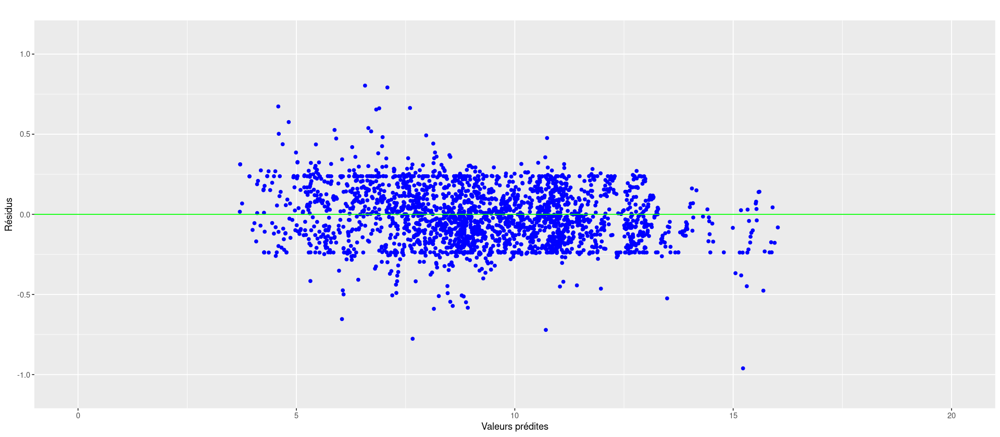

In [28]:
fit.svmr=svm.reg.rad$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

In [34]:
svm.reg.rad.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Entity - Year - Country - Period, type = "eps-regression", data = datappr, kernel = "radial", cost = c(1, 5, 10, 20, 100), gamma = seq(0.02, 0.1, by = 0.02))
summary(svm.reg.rad.tune)


Parameter tuning of ‘svm’:

- sampling method: 10-fold cross validation 

- best parameters:
 gamma cost
  0.02  100

- best performance: 0.03425156 

- Detailed performance results:
   gamma cost      error  dispersion
1   0.02    1 0.07245589 0.012064791
2   0.04    1 0.06462480 0.017783842
3   0.06    1 0.06179194 0.020526981
4   0.08    1 0.06202331 0.021865565
5   0.10    1 0.06695124 0.022861169
6   0.02    5 0.04699642 0.008501067
7   0.04    5 0.04463811 0.017058028
8   0.06    5 0.04692718 0.022042770
9   0.08    5 0.05075529 0.023053092
10  0.10    5 0.05545047 0.024330838
11  0.02   10 0.04109162 0.008656753
12  0.04   10 0.04263057 0.017286539
13  0.06   10 0.04647141 0.021807151
14  0.08   10 0.05058380 0.022916840
15  0.10   10 0.05517446 0.024294448
16  0.02   20 0.03783358 0.008848242
17  0.04   20 0.04161449 0.016953860
18  0.06   20 0.04623848 0.021720992
19  0.08   20 0.05034788 0.023239278
20  0.10   20 0.05500161 0.024197357
21  0.02  100 0.03425156 0.007377152
22

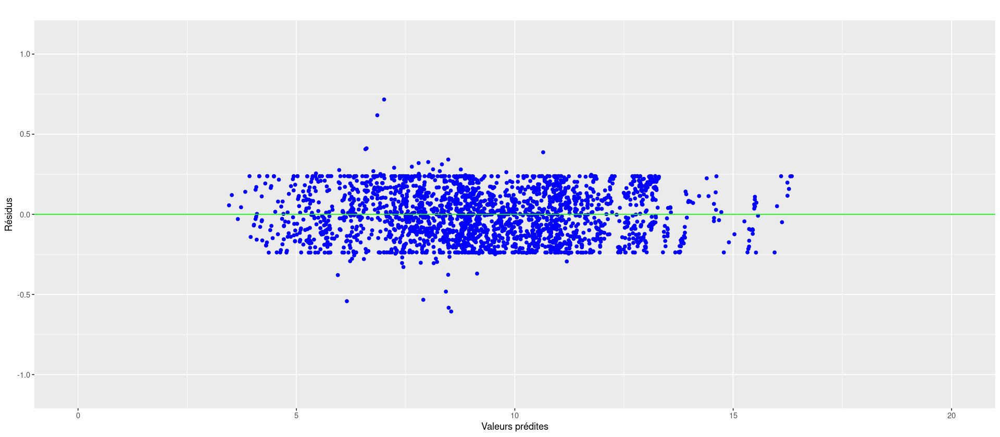

In [35]:
fit.svmr=svm.reg.rad.tune$best.model$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

In [36]:
pred.svmr.lin.tune=predict(svm.reg.lin.tune$best.model,newdata=datestr)
pred.svmr.poly = predict(svm.reg.poly, newdata=datestr)
pred.svmr.poly.tune = predict(svm.reg.poly.tune$best.model, newdata = datestr)
pred.svmr.rad = predict(svm.reg.rad, newdata=datestr)
pred.svmr.rad.tune = predict(svm.reg.rad.tune$best.model, newdata = datestr)

paste("Tuned linear kernel:",sum((pred.svmr.lin.tune-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")
paste("Default polynomial kernel:",sum((pred.svmr.poly-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")
paste("Tuned polynomial kernel:",sum((pred.svmr.poly.tune-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")
paste("Default radial kernel:",sum((pred.svmr.rad-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")
paste("Tuned radial kernel:",sum((pred.svmr.rad.tune-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")

[1] "Tuned linear kernel: 0.16044659628599"

[1] "Default polynomial kernel: 0.215802249390441"

[1] "Tuned polynomial kernel: 0.0346346071750091"

[1] "Default radial kernel: 0.0650436133015688"

[1] "Tuned radial kernel: 0.0349294697223709"

#### On peut voir que nos deux meilleurs modèles sont avec un noyau radial et polynomial tuné.

In [28]:
### conclusion partie 2 : Tuned polynomial  et radial sont les meilleurs avec une erreur de généralisation de 0.034
### meilleur aussi que Lasso avec lambda min (pour rappel : 0.09)

## IV. 4 - Cart et randomForest

In [135]:
library(rpart) 

In [152]:
tree.reg=rpart(Value_co2_emissions_kt_by_country ~ . - Country - Year ,data=datappr,control=rpart.control(cp=0.001))

Warning message:
“labs do not fit even at cex 0.15, there may be some overplotting”


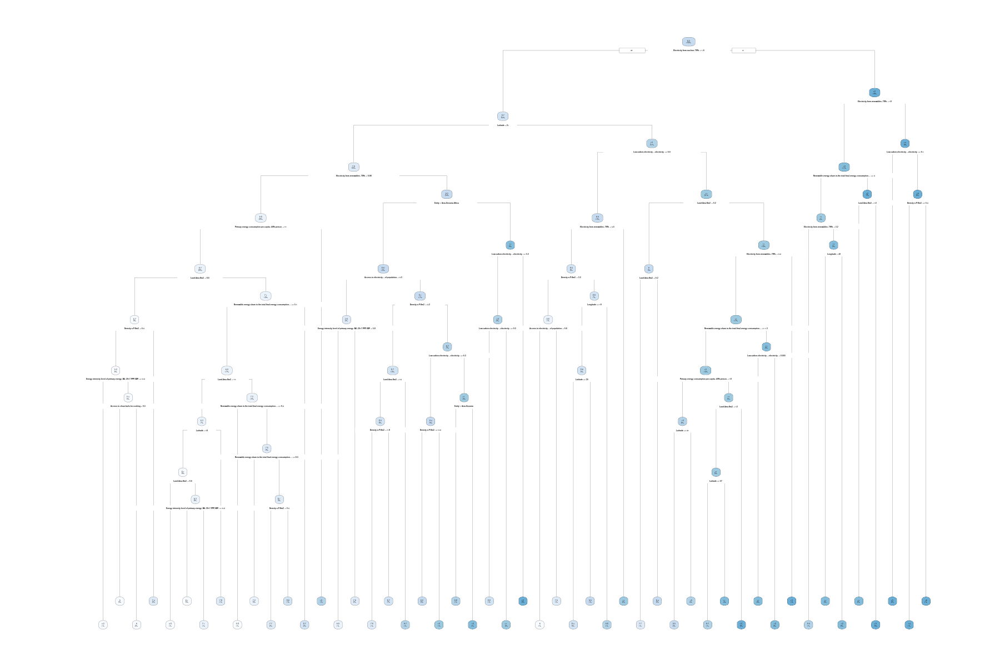

In [153]:
library(rpart.plot)
options(repr.plot.width = 15, repr.plot.height = 10)
rpart.plot(tree.reg)

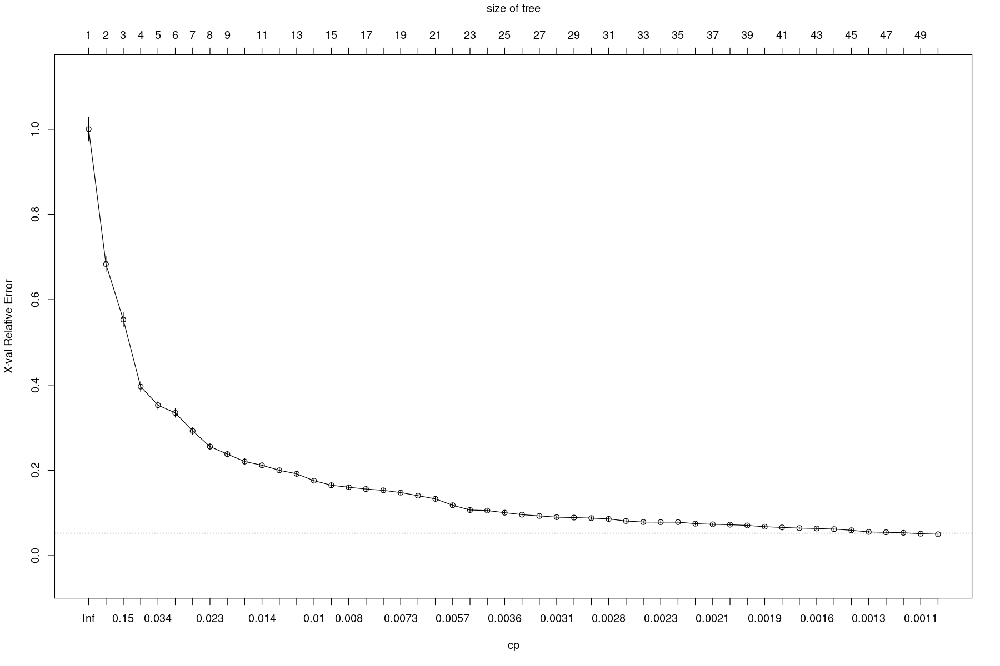

In [154]:
xmat<-xpred.rpart(tree.reg,xval=10) 
# one row for each observation and one column for each complexity value

# Cross-validation error par valeur de CP
CVerr<-apply((xmat-datappr[,"Value_co2_emissions_kt_by_country"])^2,2,sum)

plotcp(tree.reg)

[1] 0.001002231

Warning message:
“labs do not fit even at cex 0.15, there may be some overplotting”


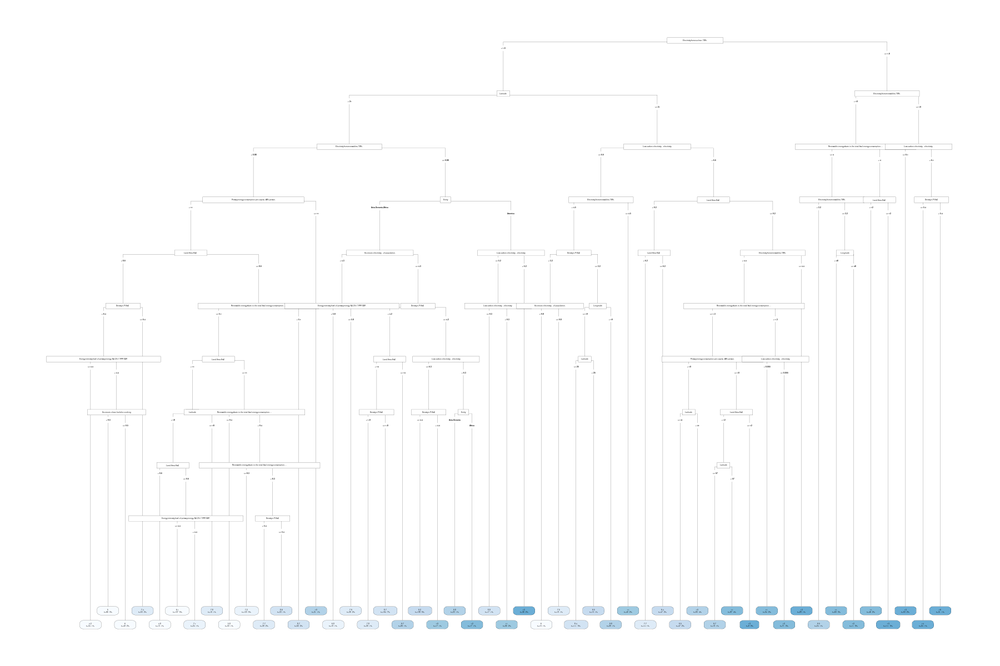

In [166]:
as.numeric(attributes(which.min(CVerr))$names)
tree.reg=rpart(Value_co2_emissions_kt_by_country~. - Country - Year,data=datappr,control=rpart.control(cp=as.numeric(attributes(which.min(CVerr))$names)))
rpart.plot(tree.reg,type=5,extra=101)

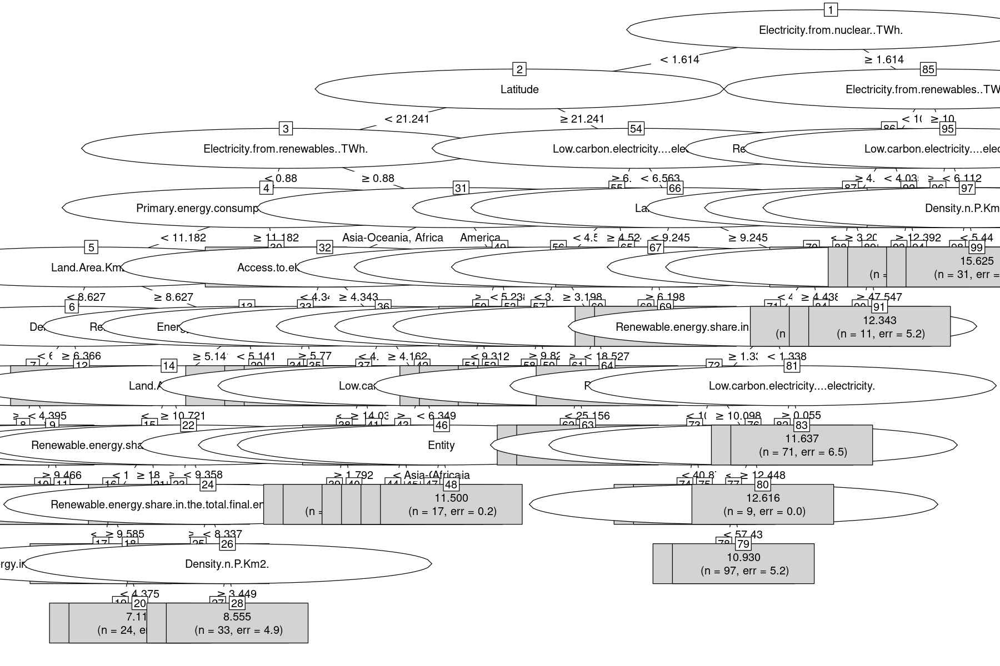

In [167]:
library(partykit)
plot(as.party(tree.reg), type="simple")

Warning message:
“Removed 25 rows containing missing values (`geom_point()`).”


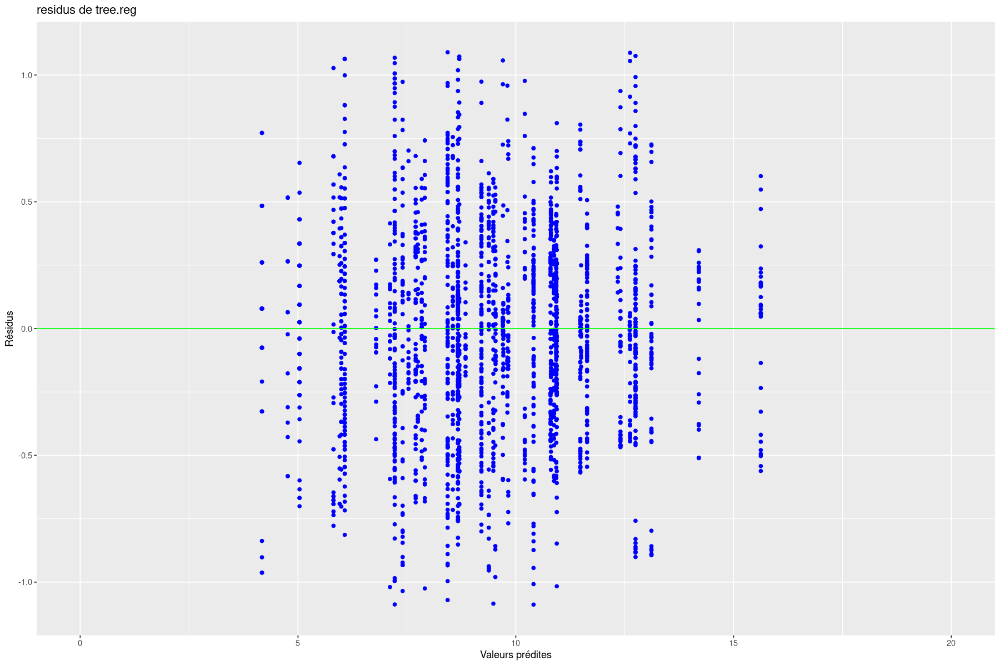

In [168]:
fit.tree=predict(tree.reg)
res.tree=fit.tree-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.tree,res.tree,"residus de tree.reg")

In [169]:
# Calcul des prévisions
pred.treer=predict(tree.reg,newdata=datestr)
# Erreur quadratique moyenne de prévision en régression
sum((pred.treer-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.2549591

In [170]:
library(randomForest)

In [178]:
rf.reg=randomForest(Value_co2_emissions_kt_by_country~ . - Country - Year, data=datappr,xtest=datestr[,-c(18,2,11)],ytest=datestr[,"Value_co2_emissions_kt_by_country"],
   ntree=500,do.trace=50,importance=TRUE)
attributes(rf.reg)
rf.reg$mtry

     |      Out-of-bag   |       Test set    |
Tree |      MSE  %Var(y) |      MSE  %Var(y) |
  50 |  0.02357     0.42 |  0.01686     0.29 |
 100 |  0.01999     0.35 |  0.01593     0.27 |
 150 |  0.01813     0.32 |  0.01584     0.27 |
 200 |  0.01819     0.32 |  0.01547     0.27 |
 250 |  0.01784     0.32 |   0.0153     0.26 |
 300 |  0.01764     0.31 |  0.01531     0.26 |
 350 |  0.01749     0.31 |  0.01546     0.27 |
 400 |  0.01722     0.30 |  0.01526     0.26 |
 450 |  0.01703     0.30 |  0.01524     0.26 |
 500 |  0.01698     0.30 |  0.01526     0.26 |


$names
 [1] "call"            "type"            "predicted"       "mse"            
 [5] "rsq"             "oob.times"       "importance"      "importanceSD"   
 [9] "localImportance" "proximity"       "ntree"           "mtry"           
[13] "forest"          "coefs"           "y"               "test"           
[17] "inbag"           "terms"          

$class
[1] "randomForest.formula" "randomForest"

[1] 5

Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”


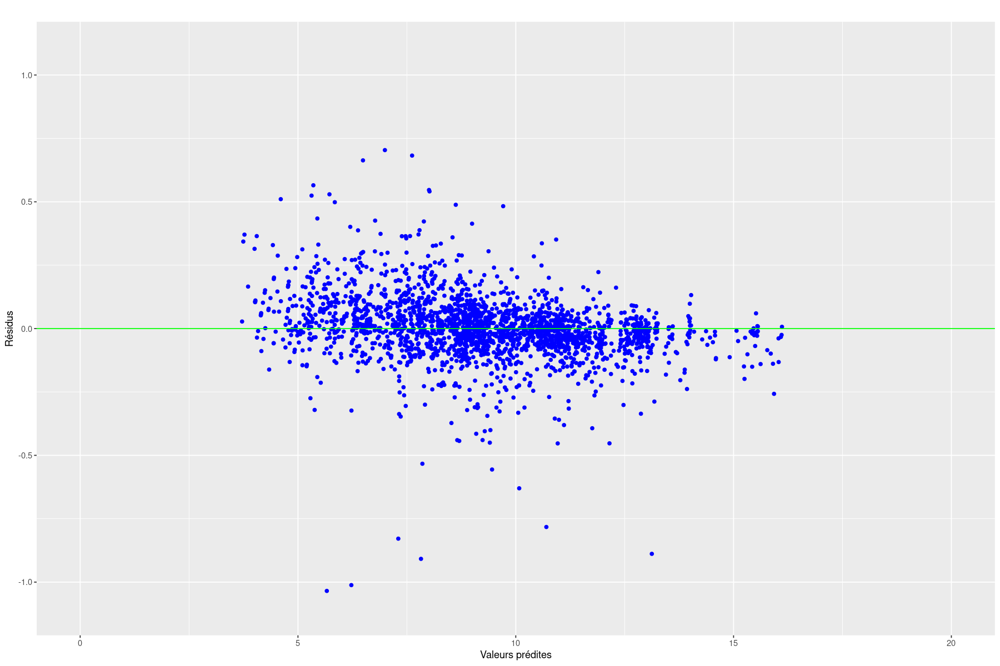

In [179]:
fit.rfr=rf.reg$predicted
res.rfr=fit.rfr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.rfr,res.rfr,titre="")

Land.Area.Km2. 
                                                           48.24 
                                                Density.n.P.Km2. 
                                                           41.63 
                          Low.carbon.electricity....electricity. 
                                                           36.38 
                               Electricity.from.renewables..TWh. 
                                                           36.24 
                                                          Period 
                                                           32.20 
                                                        Latitude 
                                                           31.22 
                                                       Longitude 
                                                           29.98 
     Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. 
                                                           28.55 
Renewable.energy.share.in.the.total.final.energy.consumption.... 
                                                           25.93 
              Primary.energy.consumption.per.capita..kWh.person. 
                                                           25.26 
                                  Electricity.from.nuclear..TWh. 
                                                           22.41 
                                                  gdp_per_capita 
                                                           20.91 
                               Access.to.clean.fuels.for.cooking 
                                                           20.41 
                         Access.to.electricity....of.population. 
                                                           19.98 
                                                          Entity 
                                                           14.43 
                                                      gdp_growth 
                                                           10.93

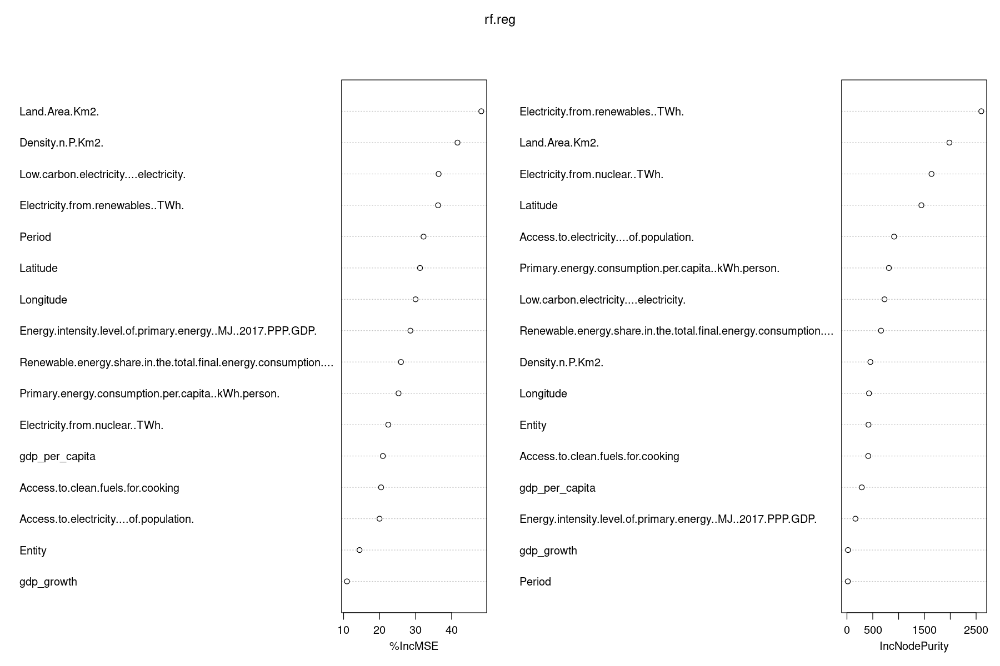

In [173]:
sort(round(importance(rf.reg), 2)[,1], decreasing=TRUE)
varImpPlot(rf.reg)

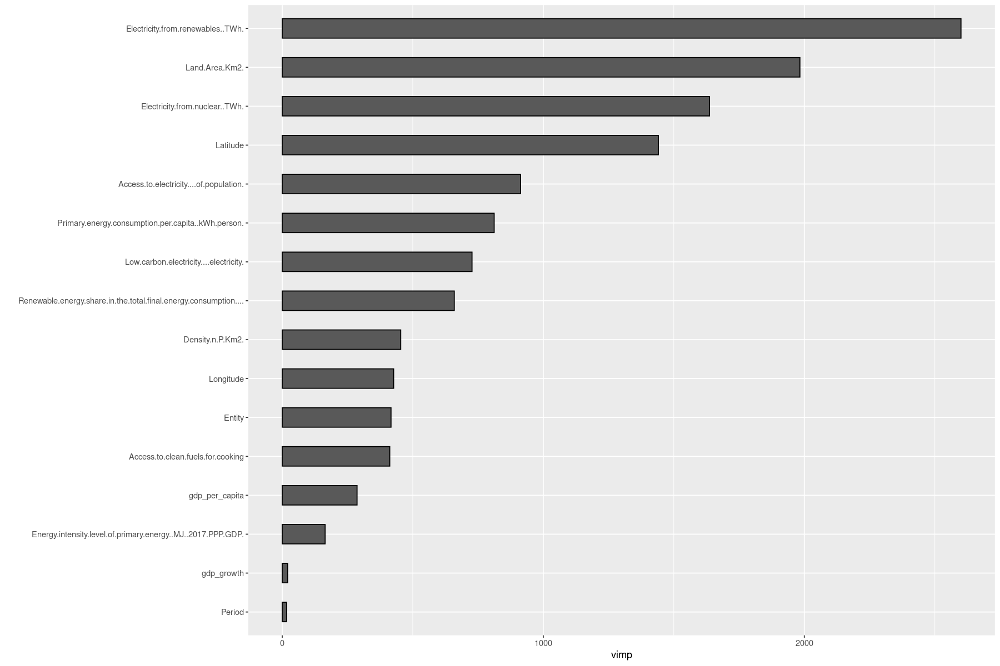

In [174]:
library(ggRandomForests)
plot(gg_vimp(rf.reg))

In [177]:
# Forêts aléatoires
pred.rfr=rf.reg$test$predicted
# Erreur quadratique moyenne de prévision
sum((pred.rfr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.01581991

In [176]:
### conclusion : Random Forest mieux que toutes les méthodes précédemment implémentées, erreur : 0.014

In [16]:
install.packages("gbm")
library(gbm)

Installation du package dans ‘/home/apommier/R/libs’
(car ‘lib’ n'est pas spécifié)



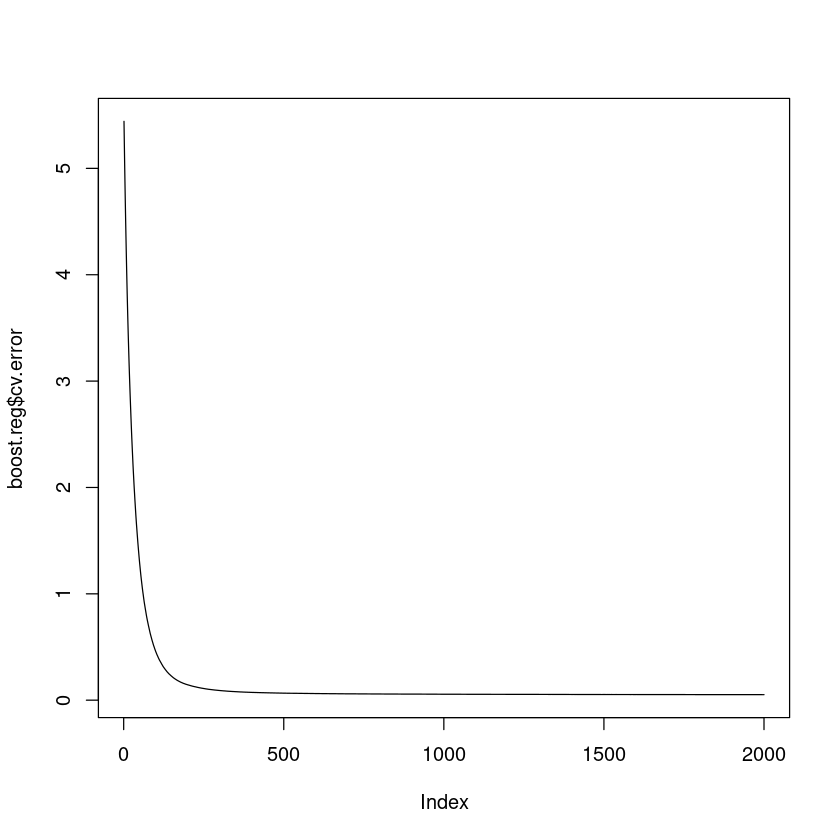

In [27]:
boost.reg = gbm(Value_co2_emissions_kt_by_country ~ . - Type - Period, data = datappr, distribution = "gaussian", n.trees = 2000, 
    cv.folds = 10, n.minobsinnode = 5, shrinkage = 0.03, verbose = FALSE)
# fixer verbose à FALSE pour éviter trop de sorties
plot(boost.reg$cv.error, type = "l")

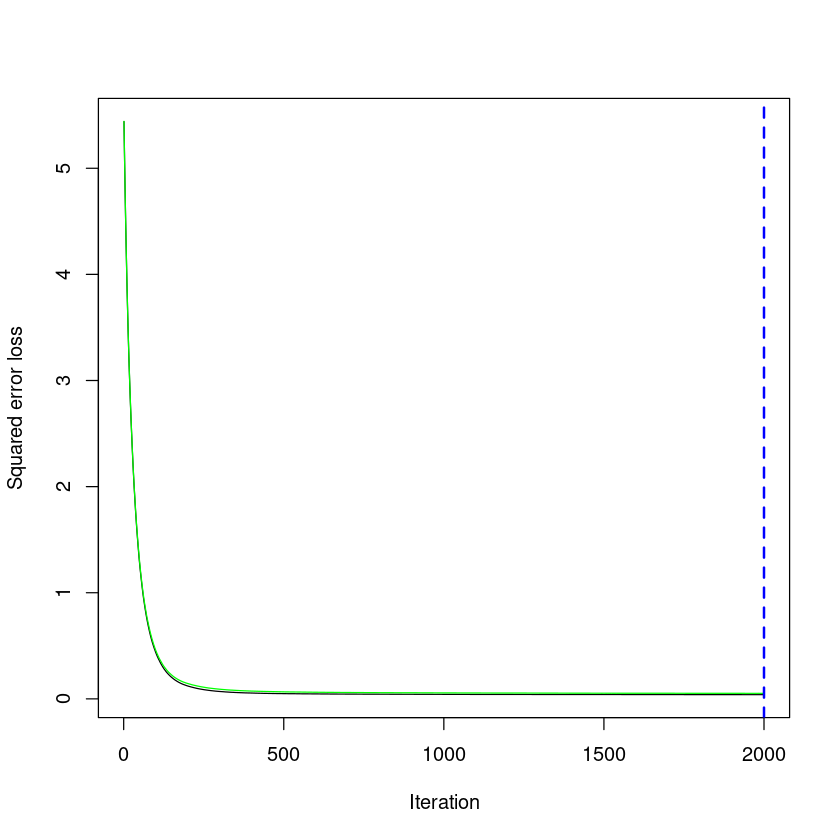

In [28]:
best.iter=gbm.perf(boost.reg,method="cv")

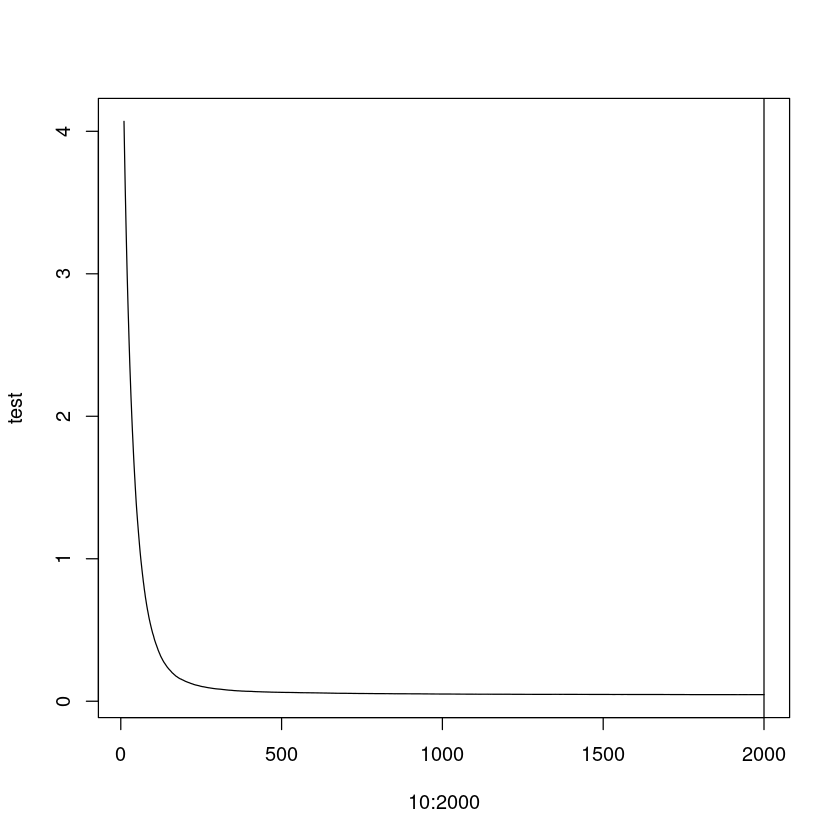

In [31]:
test=numeric()
for (i in 10:2000){
pred.test=predict(boost.reg,newdata=datestr,n.trees=i)
err=sum((pred.test-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)
test=c(test,err)}
plot(10:2000,test,type="l")
abline(v=best.iter)

Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”


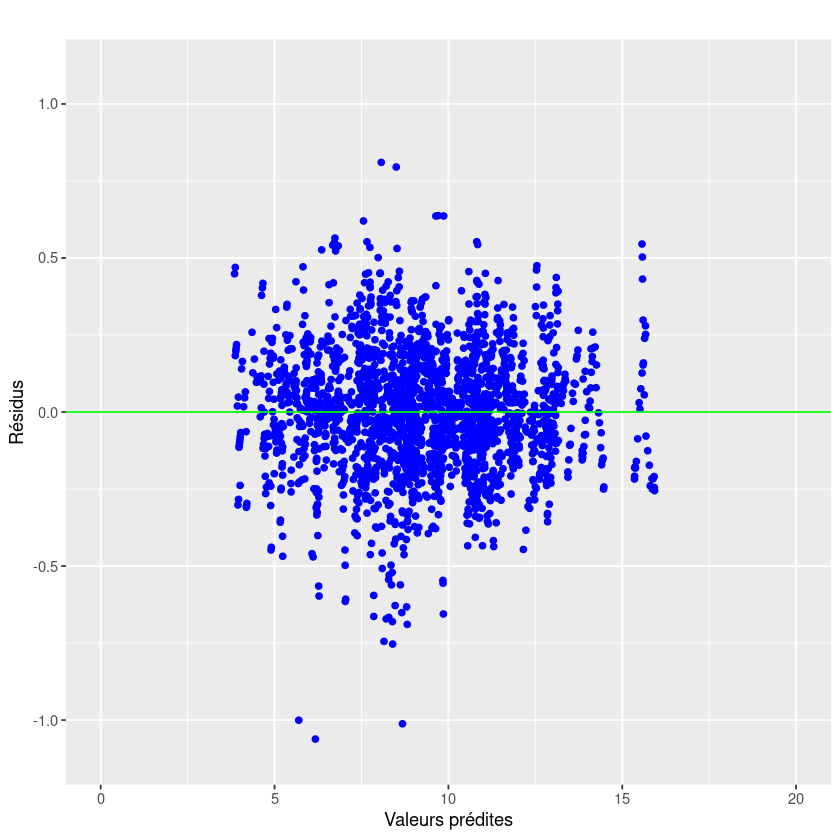

In [32]:
fit.boostr=boost.reg$fit
res.boostr=fit.boostr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.boostr,res.boostr,titre="")

In [33]:
pred.boostr=predict(boost.reg,newdata=datestr,n.trees=best.iter)
# Erreur quadratique moyenne de prévision
sum((pred.boostr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.04612539

In [25]:
## moins bien que random forest, moins bien  que poly et radial tunned, mieux que ML tout de même

In [16]:
library(MASS)
library(nnet)


Attachement du package : ‘MASS’


L'objet suivant est masqué depuis ‘package:plotly’:

    select


L'objet suivant est masqué depuis ‘package:dplyr’:

    select




In [18]:
# apprentissage
# attention au paramètre linout dans le cas de la régression
nnet.reg=nnet(Value_co2_emissions_kt_by_country~ . - Country - Year,data=datappr,size=12,decay=1,linout=TRUE,maxit=500) 
summary(nnet.reg)

# weights:  277
initial  value 195878.138339 
iter  10 value 9479.528569
iter  20 value 6512.036653
iter  30 value 5378.430528
iter  40 value 4782.278276
iter  50 value 4508.961088
iter  60 value 4338.580731
iter  70 value 4157.261138
iter  80 value 3857.135353
iter  90 value 3575.664699
iter 100 value 3004.963782
iter 110 value 2381.654535
iter 120 value 2025.770259
iter 130 value 1745.562426
iter 140 value 1549.205585
iter 150 value 1326.740005
iter 160 value 1137.472761
iter 170 value 943.638777
iter 180 value 734.455953
iter 190 value 655.987637
iter 200 value 551.590402
iter 210 value 475.653054
iter 220 value 407.252872
iter 230 value 358.512676
iter 240 value 322.135431
iter 250 value 295.676333
iter 260 value 270.185205
iter 270 value 253.602833
iter 280 value 239.820356
iter 290 value 231.467396
iter 300 value 225.981431
iter 310 value 219.741893
iter 320 value 214.532505
iter 330 value 210.543658
iter 340 value 206.631374
iter 350 value 202.017632
iter 360 value 198.765918
it

a 21-12-1 network with 277 weights
options were - linear output units  decay=1
  b->h1  i1->h1  i2->h1  i3->h1  i4->h1  i5->h1  i6->h1  i7->h1  i8->h1  i9->h1 
   0.29   -0.38   -0.30    0.38    0.19    0.00   -0.16    0.03   -0.07   -0.03 
i10->h1 i11->h1 i12->h1 i13->h1 i14->h1 i15->h1 i16->h1 i17->h1 i18->h1 i19->h1 
   0.30   -0.09   -0.15   -0.16   -0.02    0.24    0.64    0.14   -0.01    0.19 
i20->h1 i21->h1 
  -0.01   -0.20 
  b->h2  i1->h2  i2->h2  i3->h2  i4->h2  i5->h2  i6->h2  i7->h2  i8->h2  i9->h2 
  -0.14   -0.31    0.26    0.51    0.50    0.41   -0.26    0.31   -0.02    0.01 
i10->h2 i11->h2 i12->h2 i13->h2 i14->h2 i15->h2 i16->h2 i17->h2 i18->h2 i19->h2 
   0.02    0.28   -0.26    0.02   -0.09    0.22   -0.17   -0.05    0.26   -0.10 
i20->h2 i21->h2 
  -0.18   -0.53 
  b->h3  i1->h3  i2->h3  i3->h3  i4->h3  i5->h3  i6->h3  i7->h3  i8->h3  i9->h3 
   0.17    0.00   -0.64    0.14   -0.69   -0.31    0.49    0.38    0.06   -0.02 
i10->h3 i11->h3 i12->h3 i13->h3 i14->h3 i15

,size,decay
,<dbl>,<int>
6,8,2


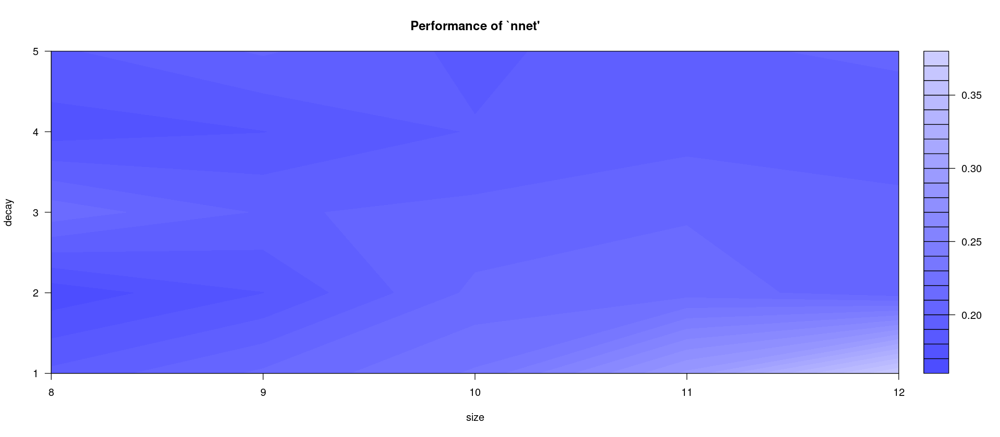

In [19]:
library(e1071)
# nombre de batch : pas de paramètre : utilise l'ensemble de données en une seule fois
# learning rate : indirectement contrôlé par decay (force de pénalisation) et d'autres paramètres
# decay : force de pénalisations/ nnet utilise maxit pour le nombre d'époques max, car toutes les observations vues en une seule fois
# size : nombre de neurones dans la couche cachée
## nb observations = 10 * nombre de poids
neur.tune = tune.nnet(Value_co2_emissions_kt_by_country ~ . - Country - Year,data=datappr,size=c(8,9,10,11,12),decay=1:5,maxit=200,linout=TRUE)
plot(neur.tune)
neur.tune$best.parameters

# weights:  70
initial  value 201952.045029 
iter  10 value 10406.499105
iter  20 value 8597.113106
iter  30 value 5632.484221
iter  40 value 4424.369083
iter  50 value 3990.502026
iter  60 value 3309.877463
iter  70 value 2461.218573
iter  80 value 2055.148007
iter  90 value 1656.122941
iter 100 value 1106.367350
iter 110 value 894.924883
iter 120 value 727.572026
iter 130 value 580.715562
iter 140 value 516.635496
iter 150 value 474.393695
iter 160 value 465.231575
iter 170 value 464.615088
iter 180 value 461.134526
iter 190 value 444.771960
iter 200 value 426.982187
iter 210 value 408.342881
iter 220 value 386.200960
iter 230 value 373.362653
iter 240 value 364.523817
iter 250 value 360.787708
iter 260 value 360.132778
iter 270 value 359.574533
iter 280 value 358.983873
iter 290 value 357.425939
iter 300 value 356.318471
iter 310 value 355.980391
iter 320 value 355.367558
iter 330 value 355.044199
iter 340 value 354.515447
iter 350 value 353.571496
iter 360 value 352.671629
iter 370

Warning message:
"Removed 1 row containing missing values or values outside the scale range (`geom_point()`)."


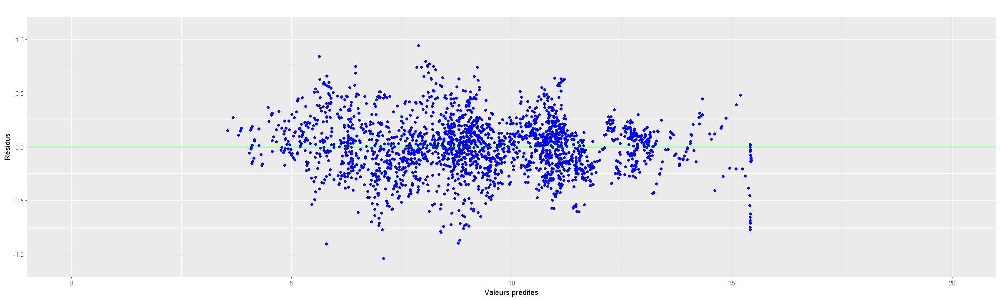

In [89]:
nnet.reg=nnet(Value_co2_emissions_kt_by_country~ . - Country - Year,data=datappr,size=3,decay=1,linout=TRUE,maxit=500)
# calcul et graphe des résidus
fit.nnetr=predict(nnet.reg,data=datappr)
res.nnetr=fit.nnetr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.nnetr,res.nnetr,titre="")

In [90]:
# Calcul des prévisions
pred.nnetr=predict(nnet.reg,newdata=datestr)
# Erreur quadratique moyenne de prévision
sum((pred.nnetr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.0660743

Conclusion : 1er : random forest (0.014)
             2nd : svm poly et radial tunned (0.034)
             3ème : boosting : (0.046)
             4ème : rdN : (0.066)
             5ème : ML Lasso : (0.11)
             6ème : CART : (0.25)

In [ ]:
### complétion des données manquantes grâce à l'algo missforest

In [185]:
# Lecture des données
energy <- read.table("energy.txt", sep = ",", header = TRUE)
# Premières lignes du jeu de données
head(energy)
# Vérification du contenu
summary(energy)
dim(energy)

,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.electricity.generating.capacity.per.capita,Financial.flows.to.developing.countries..US...,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,⋯,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,Renewables....equivalent.primary.energy.,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,9.22,20000,44.99,0.16,0,0.31,⋯,302.5948,1.64,760,NA,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,8.86,130000,45.60,0.09,0,0.50,⋯,236.8919,1.74,730,NA,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,8.47,3950000,37.83,0.13,0,0.56,⋯,210.8622,1.40,1030,NA,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,8.09,25970000,36.66,0.31,0,0.63,⋯,229.9682,1.40,1220,NA,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,7.75,NA,44.24,0.33,0,0.56,⋯,204.2312,1.20,1030,NA,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,7.51,9830000,33.88,0.34,0,0.59,⋯,252.0691,1.41,1550,NA,11.229715,242.0313,60,652230,33.93911,67.70995


    Entity               Year      Access.to.electricity....of.population.
 Length:3649        Min.   :2000   Min.   :  1.252                        
 Class :character   1st Qu.:2005   1st Qu.: 59.801                        
 Mode  :character   Median :2010   Median : 98.362                        
                    Mean   :2010   Mean   : 78.934                        
                    3rd Qu.:2015   3rd Qu.:100.000                        
                    Max.   :2020   Max.   :100.000                        
                                   NA's   :10                             
 Access.to.clean.fuels.for.cooking
 Min.   :  0.00                   
 1st Qu.: 23.18                   
 Median : 83.15                   
 Mean   : 63.26                   
 3rd Qu.:100.00                   
 Max.   :100.00                   
 NA's   :169                      
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   

[1] 3649   21

In [186]:
# Conversion de la variable Year en facteur
energy$Year <- as.factor(energy$Year)
# Conversion de la variable Density en variable numérique
energy$Density.n.P.Km2. <- as.numeric(gsub(",", "", energy$Density.n.P.Km2.))

In [187]:
energy[, "Access.to.electricity....of.population."] <- sqrt(energy[, "Access.to.electricity....of.population."])
energy[, "Access.to.clean.fuels.for.cooking"] <- sqrt(energy[, "Access.to.clean.fuels.for.cooking"])
energy[, "Renewable.energy.share.in.the.total.final.energy.consumption...."] <- sqrt(energy[, "Renewable.energy.share.in.the.total.final.energy.consumption...."])
energy[, "Electricity.from.fossil.fuels..TWh."] <- sqrt(energy[, "Electricity.from.fossil.fuels..TWh."])
energy[, "Electricity.from.nuclear..TWh."] <- sqrt(energy[, "Electricity.from.nuclear..TWh."])
energy[, "Electricity.from.renewables..TWh."] <- sqrt(energy[, "Electricity.from.renewables..TWh."])
energy[, "Low.carbon.electricity....electricity."] <- sqrt(energy[, "Low.carbon.electricity....electricity."])
energy[, "Primary.energy.consumption.per.capita..kWh.person."] <- sqrt(energy[, "Primary.energy.consumption.per.capita..kWh.person."])
energy[, "Value_co2_emissions_kt_by_country"] <- log(energy[, "Value_co2_emissions_kt_by_country"])
energy[, "gdp_per_capita"] <- log(energy[, "gdp_per_capita"])
energy[, "Density.n.P.Km2."] <- log(energy[, "Density.n.P.Km2."])
energy[, "Land.Area.Km2."] <- log(energy[, "Land.Area.Km2."])

In [94]:
energy$Country <- as.factor(energy$Entity)
energy$Entity <- as.factor(energy$Entity)
#energy$Entity <- fct_collapse(energy$Entity, "PIB ++" = c("Australia","Canada","China","Denmark","Finland","France","Germany","Iceland","Ireland","India","Italy","Japan",
                                                      #    "Luxembourg","Netherlands","Norway","Qatar","Singapore","Spain","Sweden","Switzerland","United Arab Emirates",
                                                       #   "United Kingdom","United States","Cyprus"), "PIB +" = c("Algeria","Argentina","Austria","Belgium","Brazil","Cameroon","Colombia",
                           #   "Croatia","Ecuador","Estonia","Greece","Hungary","Israel","Malta","Mexico","Morocco","New Zealand","Nigeria","Oman","Peru","Philippines","Poland","Portugal",
                            #  "Romania","Serbia","Seychelles","Thailand","Slovenia","South Africa","Tunisia","Ukraine","Uruguay"), "PIB -" = c("Armenia","Angola","Antigua and Barbuda","Azerbaijan","Bahrain",
                                                                                                                                           #    "Barbados","Belarus","Belize","Benin","Bhutan","Bosnia and Herzegovina",
                                                                                                                                           #   "Botswana","Cambodia",
                                                                                                                                           #   "Costa Rica","Cuba","Dominica","Dominican Republic","El Salvador","Equatorial Guinea",
                                                                                                                                            #  "Eswatini","Fiji","Gabon","Georgia","Ghana","Grenada","Guatemala","Guinea",
                                                                                                                                            #  "Guinea-Bissau","Guyana","Honduras","Iraq","Jamaica","Jordan","Kenya","Kuwait","Latvia","Lithuania","Maldives","Mauritius","Mongolia","Montenegro",
                                                                                                                                            #  "Namibia","Nauru","Nicaragua","North Macedonia","Pakistan","Panama","Papua New Guinea","Paraguay","Samoa",
                                                                                                                                            #  "Sri Lanka","Suriname","Tajikistan","Tonga","Trinidad and Tobago","Turkmenistan","Uzbekistan","Zimbabwe"),
                            # "PIB --" = c("Afghanistan","Bangladesh","Burkina Faso","Burundi","Central African Republic","Comoros","Chad","Djibouti","Eritrea","Ethiopia","Haiti","Kiribati","Lesotho","Liberia","Madagascar","Malawi","Mali","Mauritania","Mozambique","Myanmar","Nepal","Niger","Rwanda","Sao Tome and Principe",
                                         # "Senegal","Sierra Leone","Solomon Islands","Somalia","South Sudan","Sudan","Togo","Uganda","Vanuatu","Zambia"))
energy$Entity <- fct_collapse(energy$Entity,
  "Europe" = c("Austria","Belgium","Belarus","Bosnia and Herzegovina","Bulgaria","Croatia","Cyprus","Czechia","Denmark","Estonia","Moldova","Finland","France","Germany","Greece","Hungary","Iceland","Serbia","Portugal","Ireland","Turkey","Italy","Latvia","Lithuania","Luxembourg","Malta","Netherlands","Norway","Poland","Portugal","Montenegro","Romania","Serbia","Slovakia","Slovenia","Spain","Sweden","Switzerland","United Kingdom","Ukraine"),
  "America" = c("Barbados","Guyana","Grenada","Dominica","Cuba","Costa Rica","Belize","Antigua and Barbuda","Ecuador","Argentina","Australia","Brazil","Canada","Chile","Colombia","Mexico","Haiti","Honduras","Jamaica","Paraguay","Venezuela","Peru","Uruguay","United States","Bolivia","Suriname","El Salvador","Panama","Nicaragua","Guatemala"),
  "Asia-Oceania" = c("Nauru","Maldives","Kiribati","Bhutan","Bahrain","Afghanistan","Armenia","Azerbaijan","Bangladesh","Cambodia","Dominican Republic","Egypt","Hong Kong","China","Pakistan","New Zealand","Taiwan","United Arab Emirates","Thailand","South Korea","Philippines","Saudi Arabia","Singapore","India","Indonesia","Iran","Israel","Japan","Malaysia","Fiji","Gabon","Georgia","Iraq","Jordan","Kazakhstan","Kuwait","Kyrgyzstan","Laos","Lebanon","Lesotho","Libya","Madagascar","Malawi","Mauritania","Mauritius","Mongolia","Mozambique","Myanmar","Namibia","Nepal","North Macedonia","Oman","Papua New Guinea","Qatar","Samoa","Seychelles","Sierra Leone","Solomon Islands","Sri Lanka","Syria","Tajikistan","Tanzania","Timor-Leste","Tonga","Trinidad and Tobago","Tunisia","Turkmenistan","Uzbekistan","Vanuatu","Vietnam","Yemen"),
  "Africa" = c("Algeria","Angola","Benin","Botswana","Burkina Faso","Burundi","Cabo Verde","Cameroon","Central African Republic","Congo","Democratic Republic of Congo","Djibouti","Egypt","Equatorial Guinea","Eritrea","Eswatini","Ethiopia","Gabon","Gambia","Ghana","Guinea","Guinea-Bissau","Kenya","Lesotho","Liberia","Libya","Madagascar","Malawi","Mali","Mauritania","Mauritius","Morocco","Mozambique","Namibia","Niger","Nigeria","Rwanda","Sao Tome and Principe","Senegal","Seychelles","Sierra Leone","Somalia","South Africa","South Sudan","Sudan","Tanzania","Togo","Tunisia","Uganda","Zambia","Zimbabwe")
                              )

#df <-  matrix(df, nrow = 2868)
#df <- as.data.frame(df)
#colnames(df) = list("CO2")
#df$Entity <- energy$Entity
#df_mean <- summarise(group_by(df, Entity), mean_value = mean(CO2))
#CO2 <- df_mean$mean_value
#Entity <- df_mean$Entity
#df <- data.frame(Entity = Entity, CO2 = CO2)
#fr <- df[48,] ## France
#df <- arrange(df, desc(CO2))
#intervals <- c(0, 8, 10, 12, 14, 16)
#labels <- c("--", "-", "=", "+", "++")
#df$u <- cut(df$CO2, breaks = intervals, labels = labels, include.lowest = TRUE)
# Créer un dataframe avec les correspondances entre les pays et les modalités
#modalites <- data.frame(Entity = df$Entity, Type = df$u)
# Joindre les deux dataframes en fonction du nom du pays
#energy <- merge(energy, modalites, by = "Entity", all.x = TRUE)
# Afficher les premières lignes du dataframe pour vérifier
head(energy)
energy$Period <- fct_collapse(energy$Year, "2000-2004" = c("2000","2001","2002","2003","2004"), "2005-2009" = c("2005","2006","2007","2008","2009"),
                            "2010-2014" = c("2010","2011","2012","2013","2014"), "2015-2020" = c("2015","2016","2017","2018","2019","2020"))       
print(table(energy$Entity))
str(energy)

Warning message:
“Unknown levels in `f`: Austria, Belgium, Belarus, Bosnia and Herzegovina, Bulgaria, Croatia, Cyprus, Czechia, Denmark, Estonia, Moldova, Finland, France, Germany, Greece, Hungary, Iceland, Serbia, Portugal, Ireland, Turkey, Italy, Latvia, Lithuania, Luxembourg, Malta, Netherlands, Norway, Poland, Portugal, Montenegro, Romania, Serbia, Slovakia, Slovenia, Spain, Sweden, Switzerland, United Kingdom, Ukraine, Barbados, Guyana, Grenada, Dominica, Cuba, Costa Rica, Belize, Antigua and Barbuda, Ecuador, Argentina, Australia, Brazil, Canada, Chile, Colombia, Mexico, Haiti, Honduras, Jamaica, Paraguay, Venezuela, Peru, Uruguay, United States, Bolivia, Suriname, El Salvador, Panama, Nicaragua, Guatemala, Nauru, Maldives, Kiribati, Bhutan, Bahrain, Afghanistan, Armenia, Azerbaijan, Bangladesh, Cambodia, Dominican Republic, Egypt, Hong Kong, China, Pakistan, New Zealand, Taiwan, United Arab Emirates, Thailand, South Korea, Philippines, Saudi Arabia, Singapore, India, Indonesia, 

,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,Low.carbon.electricity....electricity.,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude,Country,Period
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>
4,Asia-Oceania,2003,3.839076,3.082207,6.054750,0,0.7937254,8.186653,5.437941,1.40,7.106606,8.832278,5.250617,4.094345,13.38815,33.93911,67.70995,Asia-Oceania,2000-2004
5,Asia-Oceania,2004,4.479394,3.301515,6.651316,0,0.7483315,7.932298,5.319253,1.20,6.937314,1.414118,5.353667,4.094345,13.38815,33.93911,67.70995,Asia-Oceania,2000-2004
6,Asia-Oceania,2005,5.038938,3.492850,5.820653,0,0.7681146,7.964977,5.529703,1.41,7.346010,11.229715,5.489067,4.094345,13.38815,33.93911,67.70995,Asia-Oceania,2005-2009
7,Asia-Oceania,2006,5.542444,3.721559,5.647123,0,0.8000000,8.728716,5.718411,1.50,7.473069,5.357403,5.574940,4.094345,13.38815,33.93911,67.70995,Asia-Oceania,2005-2009
8,Asia-Oceania,2007,6.004249,3.911521,5.364699,0,0.8660254,8.885233,5.870087,1.53,7.478735,13.826320,5.885251,4.094345,13.38815,33.93911,67.70995,Asia-Oceania,2005-2009
9,Asia-Oceania,2008,6.511528,4.086563,4.601087,0,0.7348469,8.600733,6.409901,1.94,8.177516,3.924984,5.898975,4.094345,13.38815,33.93911,67.70995,Asia-Oceania,2005-2009



Asia-Oceania       Africa      America       Europe 
         912          856          520          580 
'data.frame':	2868 obs. of  19 variables:
 $ Entity                                                          : Factor w/ 4 levels "Asia-Oceania",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Year                                                            : Factor w/ 21 levels "2000","2001",..: 4 5 6 7 8 9 10 11 12 13 ...
 $ Access.to.electricity....of.population.                         : num  3.84 4.48 5.04 5.54 6 ...
 $ Access.to.clean.fuels.for.cooking                               : num  3.08 3.3 3.49 3.72 3.91 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.05 6.65 5.82 5.65 5.36 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.794 0.748 0.768 0.8 0.866 ...
 $ Low.carbon.electricity....electricity.                          : num  8.

In [95]:
#energy$Type <- factor(energy$Type, levels = c("=","--","-","+","++"))
# Suppression de la varible Renewable.electricity.generating.capacity.per.capita
energy <- subset(energy, select = -Renewable.electricity.generating.capacity.per.capita)
# Suppression de la variable Financial.flows.to.developing.countries..US...
energy <- subset(energy, select = -Financial.flows.to.developing.countries..US...)
# Suppression de la variable Renewables....equivalent.primary.energy.
energy <- subset(energy, select =  -Renewables....equivalent.primary.energy.)
energy <- subset(energy, select = -Year)
energy <- subset(energy, select = -Country)
energy <- subset(energy, select = -Electricity.from.fossil.fuels..TWh.)
str(energy)

ERROR: Error in eval(substitute(select), nl, parent.frame()): objet 'Renewable.electricity.generating.capacity.per.capita' introuvable


In [195]:
missing_data <- colMeans(is.na(energy)) * 100

# Trier les résultats par ordre décroissant
sorted_missing_data <- sort(missing_data, decreasing = TRUE)

# Afficher les résultats de manière propre
cat("Pourcentage de données manquantes par variable (ordre décroissant):\n")
for (i in seq_along(sorted_missing_data)) {
  cat(names(sorted_missing_data)[i], ": ", sprintf("%.2f", sorted_missing_data[i]), "%\n")
}
head(energy)

Pourcentage de données manquantes par variable (ordre décroissant):
Value_co2_emissions_kt_by_country :  11.73 %
gdp_growth :  8.69 %
gdp_per_capita :  7.73 %
Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. :  5.67 %
Renewable.energy.share.in.the.total.final.energy.consumption.... :  5.32 %
Access.to.clean.fuels.for.cooking :  4.63 %
Electricity.from.nuclear..TWh. :  3.45 %
Low.carbon.electricity....electricity. :  1.15 %
Electricity.from.renewables..TWh. :  0.58 %
Access.to.electricity....of.population. :  0.27 %
Density.n.P.Km2. :  0.03 %
Land.Area.Km2. :  0.03 %
Latitude :  0.03 %
Longitude :  0.03 %
Entity :  0.00 %
Primary.energy.consumption.per.capita..kWh.person. :  0.00 %
Period :  0.00 %


,Entity,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,Low.carbon.electricity....electricity.,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude,Period
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,Asia-Oceania,1.270272,2.489980,6.707459,0,0.5567764,8.121419,17.39525,1.64,6.633318,NA,NA,4.094345,13.38815,33.93911,67.70995,2000-2004
2,Asia-Oceania,2.018557,2.683282,6.752777,0,0.7071068,9.205746,15.39129,1.74,6.593045,NA,NA,4.094345,13.38815,33.93911,67.70995,2000-2004
3,Asia-Oceania,3.067435,2.863564,6.150610,0,0.7483315,9.008853,14.52109,1.40,6.937314,NA,5.189766,4.094345,13.38815,33.93911,67.70995,2000-2004
4,Asia-Oceania,3.839076,3.082207,6.054750,0,0.7937254,8.186653,15.16470,1.40,7.106606,8.832278,5.250617,4.094345,13.38815,33.93911,67.70995,2000-2004
5,Asia-Oceania,4.479394,3.301515,6.651316,0,0.7483315,7.932298,14.29095,1.20,6.937314,1.414118,5.353667,4.094345,13.38815,33.93911,67.70995,2000-2004
6,Asia-Oceania,5.038938,3.492850,5.820653,0,0.7681146,7.964977,15.87668,1.41,7.346010,11.229715,5.489067,4.094345,13.38815,33.93911,67.70995,2005-2009


Le chargement a nécessité le package : colorspace


Attachement du package : ‘colorspace’


L'objet suivant est masqué depuis ‘package:pROC’:

    coords


VIM is ready to use.


Suggestions and bug-reports can be submitted at: https://github.com/statistikat/VIM/issues


Attachement du package : ‘VIM’


L'objet suivant est masqué depuis ‘package:datasets’:

    sleep





 Variables sorted by number of missings: 
                                                         Variable        Count
                                Value_co2_emissions_kt_by_country 0.1172924089
                                                       gdp_growth 0.0868731159
                                                   gdp_per_capita 0.0772814470
      Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. 0.0567278706
 Renewable.energy.share.in.the.total.final.energy.consumption.... 0.0531652508
                                Access.to.clean.fuels.for.cooking 0.0463140586
                                   Electricity.from.nuclear..TWh. 0.0345300082
                           Low.carbon.electricity....electricity. 0.0115100027
                                Electricity.from.renewables..TWh. 0.0057550014
                          Access.to.electricity....of.population. 0.0027404768
                                                 Density.n.P.Km2. 0.0002740477
         

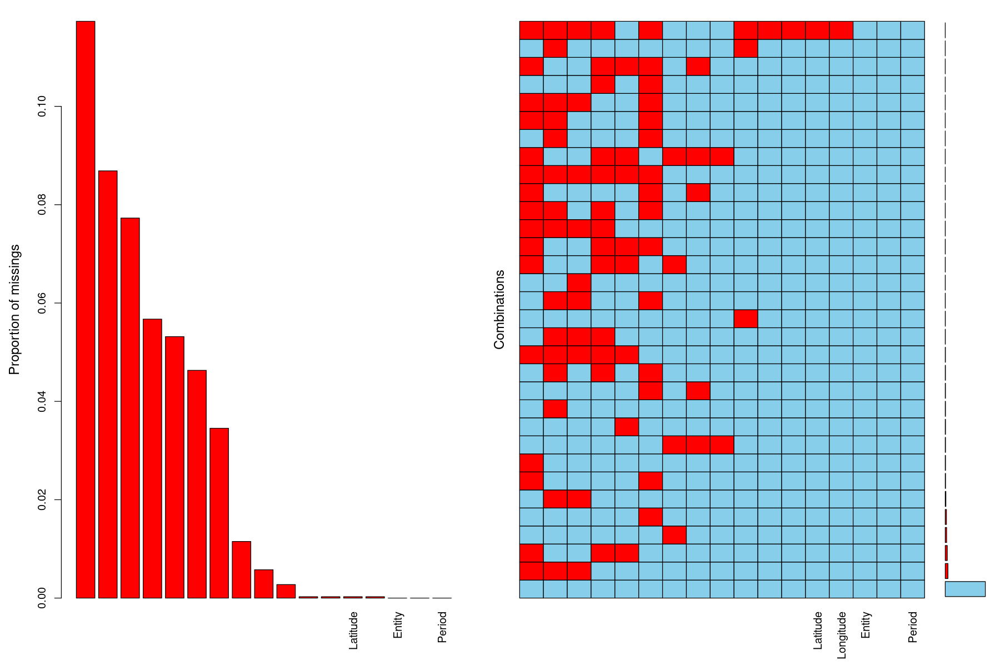

In [196]:
library(VIM)
res<-summary(aggr(energy, sortVar=TRUE))$combinations

In [197]:
library(missForest)


Attachement du package : ‘missForest’


L'objet suivant est masqué depuis ‘package:VIM’:

    nrmse




In [198]:
energyImp=missForest(energy)

In [199]:
energyImp <- energyImp$ximp
class(energyImp)
summary(energyImp)
str(energyImp)

[1] "data.frame"

          Entity     Access.to.electricity....of.population.
 Asia-Oceania:1120   Min.   : 1.119                         
 Africa      :1058   1st Qu.: 7.690                         
 America     : 799   Median : 9.913                         
 Europe      : 672   Mean   : 8.605                         
                     3rd Qu.:10.000                         
                     Max.   :10.000                         
 Access.to.clean.fuels.for.cooking
 Min.   : 0.000                   
 1st Qu.: 5.089                   
 Median : 9.214                   
 Mean   : 7.349                   
 3rd Qu.:10.000                   
 Max.   :10.000                   
 Renewable.energy.share.in.the.total.final.energy.consumption....
 Min.   :0.000                                                   
 1st Qu.:2.588                                                   
 Median :4.865                                                   
 Mean   :4.919                                                  

'data.frame':	3649 obs. of  17 variables:
 $ Entity                                                          : Factor w/ 4 levels "Asia-Oceania",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Access.to.electricity....of.population.                         : num  1.27 2.02 3.07 3.84 4.48 ...
 $ Access.to.clean.fuels.for.cooking                               : num  2.49 2.68 2.86 3.08 3.3 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.71 6.75 6.15 6.05 6.65 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.557 0.707 0.748 0.794 0.748 ...
 $ Low.carbon.electricity....electricity.                          : num  8.12 9.21 9.01 8.19 7.93 ...
 $ Primary.energy.consumption.per.capita..kWh.person.              : num  17.4 15.4 14.5 15.2 14.3 ...
 $ Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.     : num  1.64 1.74 1.4 1.4 1.2 1.41 1.5 1.

In [200]:
any_miss <- any(is.na(energyImp))
any_miss
sum(is.na(energyImp) == TRUE)

[1] FALSE

[1] 0

In [201]:
set.seed(111) # initialisation du générateur
# Extraction des échantillons
test.ratio <- .2   # part de l'échantillon test
npop <- nrow(energyImp) # nombre de lignes
nvar <- ncol(energyImp) # nombre de colonnes
# taille de l'échantillon test
ntest <- ceiling(npop * test.ratio) 
# indices de l'échantillon test
testi <- sample(1:npop, ntest)
# indices de l'échantillon d'apprentissage
appri <- setdiff(1:npop, testi) 
### pour CO2 emissions
datappr <- energyImp[appri,] 
# construction de l'échantillon test
datestr <- energyImp[testi,] 
# vérification
str(datappr)
str(datestr)

'data.frame':	2919 obs. of  17 variables:
 $ Entity                                                          : Factor w/ 4 levels "Asia-Oceania",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Access.to.electricity....of.population.                         : num  1.27 2.02 3.07 4.48 5.04 ...
 $ Access.to.clean.fuels.for.cooking                               : num  2.49 2.68 2.86 3.3 3.49 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.71 6.75 6.15 6.65 5.82 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.557 0.707 0.748 0.748 0.768 ...
 $ Low.carbon.electricity....electricity.                          : num  8.12 9.21 9.01 7.93 7.96 ...
 $ Primary.energy.consumption.per.capita..kWh.person.              : num  17.4 15.4 14.5 14.3 15.9 ...
 $ Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.     : num  1.64 1.74 1.4 1.2 1.41 1.5 1.53 1

In [202]:
gplot.res <- function(x, y, titre = "titre"){
    ggplot(data.frame(x=x, y=y),aes(x,y))+
    geom_point(col = "blue")+xlim(0, 20)+ylim(-1.1, 1.1)+
    ylab("Résidus")+ xlab("Valeurs prédites")+
    ggtitle(titre)+
    geom_hline(yintercept = 0,col="green")
}

In [16]:
library(e1071)

In [17]:
svm.reg.poly.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Entity - Period, type = "eps-regression", data = datappr, kernel = "poly", cost = c(1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5), coef0 = 0:8, gamma = seq(0.02, 0.1, by = 0.02))
summary(svm.reg.poly.tune)


Parameter tuning of ‘svm’:

- sampling method: 10-fold cross validation 

- best parameters:
 gamma coef0 cost
  0.08     2  1.5

- best performance: 0.03719773 

- Detailed performance results:
    gamma coef0 cost      error  dispersion
1    0.02     0  1.0 1.57397102 1.151682316
2    0.04     0  1.0 0.68129725 0.797974779
3    0.06     0  1.0 0.39477726 0.459620817
4    0.08     0  1.0 0.32634228 0.459941303
5    0.10     0  1.0 0.28787654 0.458994665
6    0.02     1  1.0 0.17009684 0.332697229
7    0.04     1  1.0 0.12372467 0.236011629
8    0.06     1  1.0 0.06100977 0.060394218
9    0.08     1  1.0 0.04187800 0.012945759
10   0.10     1  1.0 0.04065795 0.015042286
11   0.02     2  1.0 0.16226506 0.314497598
12   0.04     2  1.0 0.15190430 0.326378693
13   0.06     2  1.0 0.05230482 0.035295882
14   0.08     2  1.0 0.03875427 0.005523977
15   0.10     2  1.0 0.04451011 0.028107436
16   0.02     3  1.0 0.14957473 0.276002017
17   0.04     3  1.0 0.15590876 0.339552434
18   0.06   

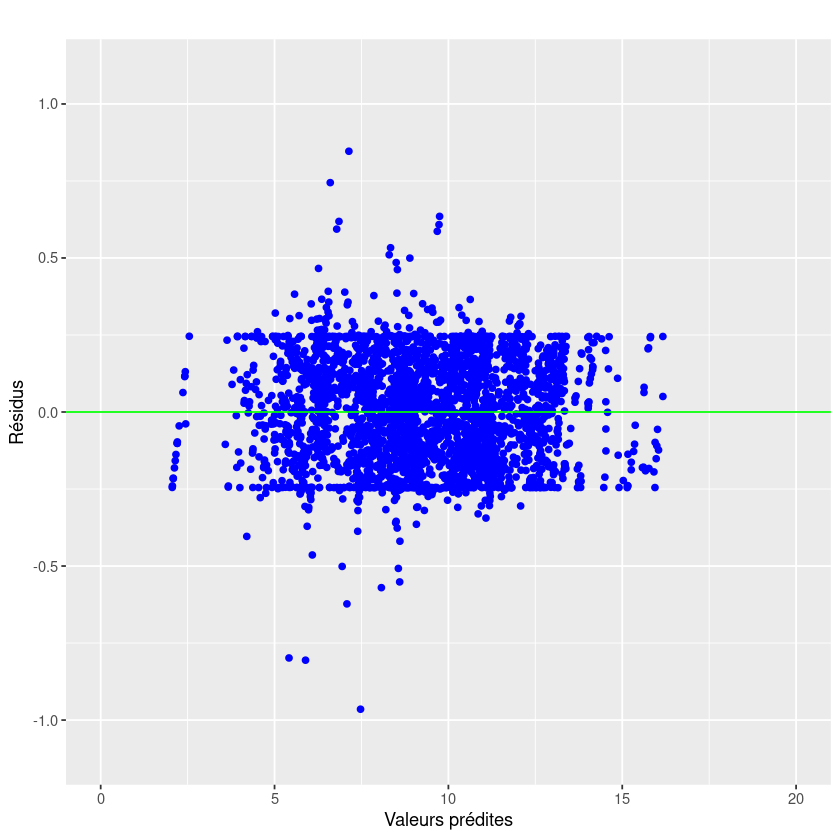

In [18]:
fit.svmr=svm.reg.poly.tune$best.model$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

In [19]:
pred.svmr.poly.tune = predict(svm.reg.poly.tune$best.model, newdata = datestr)
paste("Tuned polynomial kernel:",sum((pred.svmr.poly.tune-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")

[1] "Tuned polynomial kernel: 0.0364595936573244"

In [65]:
library(randomForest)

In [208]:
rf.reg=randomForest(Value_co2_emissions_kt_by_country~., data=datappr,xtest=datestr[,-10],ytest=datestr[,"Value_co2_emissions_kt_by_country"],
   ntree=500,do.trace=50,importance=TRUE)
attributes(rf.reg)
rf.reg$mtry

     |      Out-of-bag   |       Test set    |
Tree |      MSE  %Var(y) |      MSE  %Var(y) |
  50 |  0.02703     0.45 |  0.01703     0.29 |
 100 |  0.02337     0.39 |  0.01603     0.27 |
 150 |  0.02131     0.36 |  0.01541     0.26 |
 200 |  0.01894     0.32 |  0.01535     0.26 |
 250 |  0.01818     0.30 |  0.01513     0.25 |
 300 |  0.01733     0.29 |  0.01511     0.25 |
 350 |  0.01794     0.30 |  0.01504     0.25 |
 400 |  0.01781     0.30 |  0.01509     0.25 |
 450 |  0.01807     0.30 |  0.01506     0.25 |
 500 |  0.01793     0.30 |    0.015     0.25 |


$names
 [1] "call"            "type"            "predicted"       "mse"            
 [5] "rsq"             "oob.times"       "importance"      "importanceSD"   
 [9] "localImportance" "proximity"       "ntree"           "mtry"           
[13] "forest"          "coefs"           "y"               "test"           
[17] "inbag"           "terms"          

$class
[1] "randomForest.formula" "randomForest"

[1] 5

Warning message:
“Removed 3 rows containing missing values (`geom_point()`).”


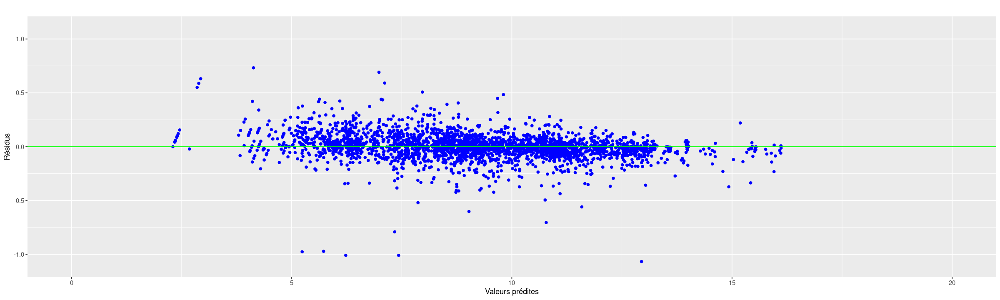

In [209]:
fit.rfr=rf.reg$predicted
res.rfr=fit.rfr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.rfr,res.rfr,titre="")

Land.Area.Km2. 
                                                           42.03 
                                                Density.n.P.Km2. 
                                                           42.00 
                          Low.carbon.electricity....electricity. 
                                                           40.20 
                                                        Latitude 
                                                           35.60 
                               Electricity.from.renewables..TWh. 
                                                           35.29 
                                                       Longitude 
                                                           30.38 
Renewable.energy.share.in.the.total.final.energy.consumption.... 
                                                           28.98 
     Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. 
                                                           28.73 
              Primary.energy.consumption.per.capita..kWh.person. 
                                                           28.26 
                                                          Period 
                                                           25.60 
                                  Electricity.from.nuclear..TWh. 
                                                           25.49 
                               Access.to.clean.fuels.for.cooking 
                                                           21.51 
                                                  gdp_per_capita 
                                                           18.93 
                                                          Entity 
                                                           18.46 
                         Access.to.electricity....of.population. 
                                                           16.62 
                                                      gdp_growth 
                                                           12.70

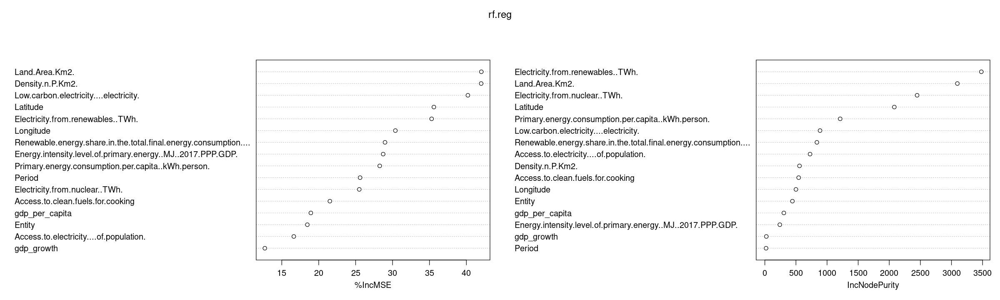

In [210]:
options(repr.plot.width = 20, repr.plot.height = 6)
sort(round(importance(rf.reg), 2)[,1], decreasing=TRUE)
varImpPlot(rf.reg)

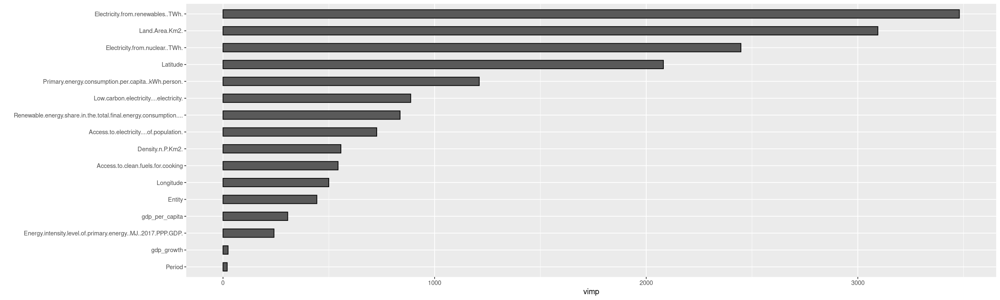

In [211]:
library(ggRandomForests)
plot(gg_vimp(rf.reg))

In [212]:
# Forêts aléatoires
pred.rfr=rf.reg$test$predicted
# Erreur quadratique moyenne de prévision
sum((pred.rfr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.01499986

In [73]:
## encore de meilleures prédictions lors de complétion des données manquantes

In [37]:
library(MASS)
library(nnet)
# apprentissage
# attention au paramètre linout dans le cas de la régression
nnet.reg=nnet(Value_co2_emissions_kt_by_country ~ . ,data=datappr,size=15,decay=1,linout=TRUE,maxit=500) 
summary(nnet.reg)

# weights:  346
initial  value 344539.519736 
iter  10 value 12719.669645
iter  20 value 11253.619973
iter  30 value 9434.863988
iter  40 value 7735.565495
iter  50 value 6490.735537
iter  60 value 5873.292003
iter  70 value 5482.742984
iter  80 value 5153.056369
iter  90 value 4903.537714
iter 100 value 4761.335787
iter 110 value 4103.333999
iter 120 value 3469.588193
iter 130 value 3099.900981
iter 140 value 2818.086479
iter 150 value 2336.055613
iter 160 value 2064.389365
iter 170 value 1889.701787
iter 180 value 1537.452444
iter 190 value 1216.490978
iter 200 value 1071.218006
iter 210 value 890.529647
iter 220 value 773.311818
iter 230 value 677.076456
iter 240 value 574.852585
iter 250 value 497.982594
iter 260 value 448.049806
iter 270 value 405.242121
iter 280 value 380.149503
iter 290 value 351.942193
iter 300 value 334.420004
iter 310 value 320.148019
iter 320 value 305.435668
iter 330 value 295.239947
iter 340 value 285.828189
iter 350 value 279.317596
iter 360 value 274.331

a 21-15-1 network with 346 weights
options were - linear output units  decay=1
  b->h1  i1->h1  i2->h1  i3->h1  i4->h1  i5->h1  i6->h1  i7->h1  i8->h1  i9->h1 
  -0.32   -0.06    0.17    0.80    0.20    0.03   -0.03    0.03    0.20   -0.01 
i10->h1 i11->h1 i12->h1 i13->h1 i14->h1 i15->h1 i16->h1 i17->h1 i18->h1 i19->h1 
  -0.31    0.34   -0.58   -0.06    0.03   -0.16   -0.36   -0.05    0.13    0.06 
i20->h1 i21->h1 
  -0.31   -0.38 
  b->h2  i1->h2  i2->h2  i3->h2  i4->h2  i5->h2  i6->h2  i7->h2  i8->h2  i9->h2 
  -0.31   -0.05    0.10   -0.27   -0.14    0.57    0.44    0.03    0.00    0.00 
i10->h2 i11->h2 i12->h2 i13->h2 i14->h2 i15->h2 i16->h2 i17->h2 i18->h2 i19->h2 
  -0.08    0.32    0.05   -0.14   -0.05    0.17    0.01    0.23    0.00    0.08 
i20->h2 i21->h2 
   0.06    0.09 
  b->h3  i1->h3  i2->h3  i3->h3  i4->h3  i5->h3  i6->h3  i7->h3  i8->h3  i9->h3 
  -0.20    0.10    0.34   -0.22   -0.09   -0.09   -0.05    0.09    0.12    0.00 
i10->h3 i11->h3 i12->h3 i13->h3 i14->h3 i15

In [38]:
library(e1071)
neur.tune = tune.nnet(Value_co2_emissions_kt_by_country ~ . ,data=datappr,size=c(10,11,12,13,14,15),decay=1:5,maxit=500,linout=TRUE)
plot(neur.tune)
neur.tune$best.parameters

# weights:  231
initial  value 291305.081659 
iter  10 value 14872.953964
iter  20 value 11237.098524
iter  30 value 10017.469079
iter  40 value 8704.945298
iter  50 value 7888.139946
iter  60 value 7252.399538
iter  70 value 6919.075503
iter  80 value 6404.067965
iter  90 value 5936.191816
iter 100 value 5154.160377
iter 110 value 4187.057298
iter 120 value 3213.057384
iter 130 value 2463.682112
iter 140 value 1969.277886
iter 150 value 1560.005281
iter 160 value 1212.342850
iter 170 value 934.844256
iter 180 value 751.224285
iter 190 value 654.792607
iter 200 value 563.762304
iter 210 value 490.099279
iter 220 value 438.419815
iter 230 value 403.503155
iter 240 value 377.751911
iter 250 value 359.519391
iter 260 value 349.795988
iter 270 value 341.497571
iter 280 value 330.422446
iter 290 value 319.056048
iter 300 value 310.915892
iter 310 value 304.849118
iter 320 value 300.113046
iter 330 value 296.985557
iter 340 value 294.297554
iter 350 value 292.136686
iter 360 value 290.236825

Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”


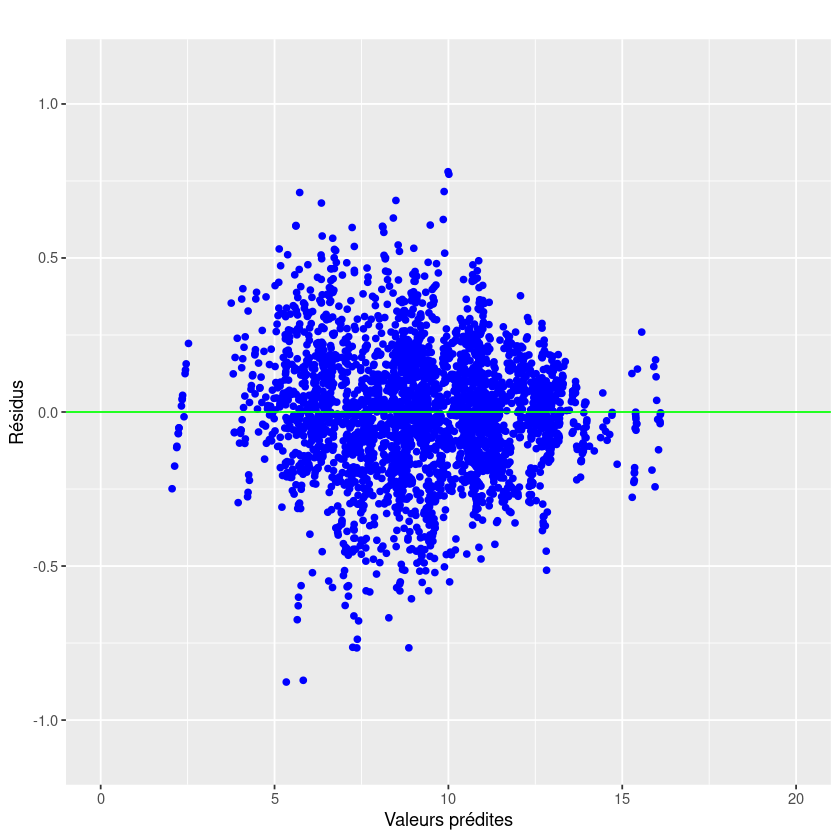

In [33]:
nnet.reg=nnet(Value_co2_emissions_kt_by_country~ .,data=datappr,size=10,decay=2,linout=TRUE,maxit=500)
# calcul et graphe des résidus
fit.nnetr=predict(nnet.reg,data=datappr)
res.nnetr=fit.nnetr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.nnetr,res.nnetr,titre="")

In [34]:
# Calcul des prévisions
pred.nnetr=predict(nnet.reg,newdata=datestr)
# Erreur quadratique moyenne de prévision
sum((pred.nnetr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.05001528